In [3]:
!pip uninstall -y keras tensorflow
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cpu
!pip install transformers
!pip install transformers datasets torch
# !pip install --upgrade --force-reinstall pyarrow==16.1.0 --no-deps -q
!pip install -U transformers datasets accelerate

# import importlib, pyarrow
# importlib.reload(pyarrow)

from datasets import Dataset

Looking in indexes: https://download.pytorch.org/whl/cpu


In [5]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_absolute_error, accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.compose import ColumnTransformer
from datasets import Dataset
from transformers import AutoTokenizer, AutoModelForSequenceClassification, Trainer, TrainingArguments
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import torch

!pip install ipywidgets
# jupyter nbextension enable --py widgetsnbextension --sys-prefix
!pip install jupyterlab_widgets


In [7]:
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV

# Import dataset from final_data_version.csv
df_balanced = pd.read_csv("../data/final_data_version.csv")

# Split my data
(X_train, X_test, y_train, y_test) = train_test_split(df_balanced.description, df_balanced.category, test_size=0.2, random_state=42)

In [77]:
# Run before training models

# Prepare data
le = LabelEncoder()
df_balanced['label'] = le.fit_transform(df_balanced['category'])

# Ensure correct column name
X_train, X_test, y_train, y_test = train_test_split(
    df_balanced['description'],
    df_balanced['label'],
    test_size=0.2,
    stratify=df_balanced['label'],
    random_state=42
)

# Convert to Hugging Face Datasets
train_dataset = Dataset.from_dict({'text': X_train.tolist(), 'label': y_train.tolist()})
test_dataset  = Dataset.from_dict({'text': X_test.tolist(),  'label': y_test.tolist()})

In [9]:
# Experiment using the BERT

# BERT Model
bert_model = "bert-base-uncased"

tokenizer_bert = AutoTokenizer.from_pretrained(bert_model)

def tokenize(batch):
    return tokenizer_bert(batch['text'], padding='max_length', truncation=True, max_length=256)

train_dataset = train_dataset.map(tokenize, batched=True)
test_dataset  = test_dataset.map(tokenize, batched=True)

train_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
test_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])

# Load model
num_labels = len(le.classes_)
model = AutoModelForSequenceClassification.from_pretrained(bert_model, num_labels=num_labels)

# Training config
training_args = TrainingArguments(
    output_dir="./results",
    do_eval=True,                 # instead of evaluation_strategy
    num_train_epochs=3,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    learning_rate=2e-5,
    weight_decay=0.01,
    logging_dir="./logs",
    logging_steps=100
)


# Trainer
trainer_bert = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    tokenizer=tokenizer_bert
)

# Train
trainer_bert.train()


Map:   0%|          | 0/38592 [00:00<?, ? examples/s]

Map:   0%|          | 0/9648 [00:00<?, ? examples/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/var/folders/gs/rm1mjp5x5ybc93h8m4xwbfyr0000gn/T/ipykernel_13887/3274271668.py:36: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer_bert = Trainer(
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Step,Training Loss
100,2.100500
200,1.550700
300,1.247800
400,1.125500
500,1.108600
600,1.075300
700,1.003300
800,1.037800
900,0.928700
1000,0.983100


/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


TrainOutput(global_step=14472, training_loss=0.6442728026787045, metrics={'train_runtime': 7957.154, 'train_samples_per_second': 14.55, 'train_steps_per_second': 1.819, 'total_flos': 1.5232066794749952e+16, 'train_loss': 0.6442728026787045, 'epoch': 3.0})

In [10]:
# Evaluate Bert Model
preds_output_bert = trainer_bert.predict(test_dataset)
y_pred_bert = preds_output_bert.predictions.argmax(axis=1)
print(classification_report(y_test, y_pred_bert, target_names=le.classes_))

/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


                       precision    recall  f1-score   support

                  art       0.67      0.69      0.68      1000
     business/finance       0.84      0.81      0.82       923
       fantasy/horror       0.68      0.71      0.70      1000
                 food       0.83      0.80      0.82       891
              history       0.71      0.67      0.69      1000
religion/spirituality       0.72      0.77      0.75      1000
              romance       0.79      0.77      0.78      1000
              science       0.70      0.70      0.70      1000
      science fiction       0.73      0.72      0.72       966
             thriller       0.75      0.76      0.75       868

             accuracy                           0.74      9648
            macro avg       0.74      0.74      0.74      9648
         weighted avg       0.74      0.74      0.74      9648



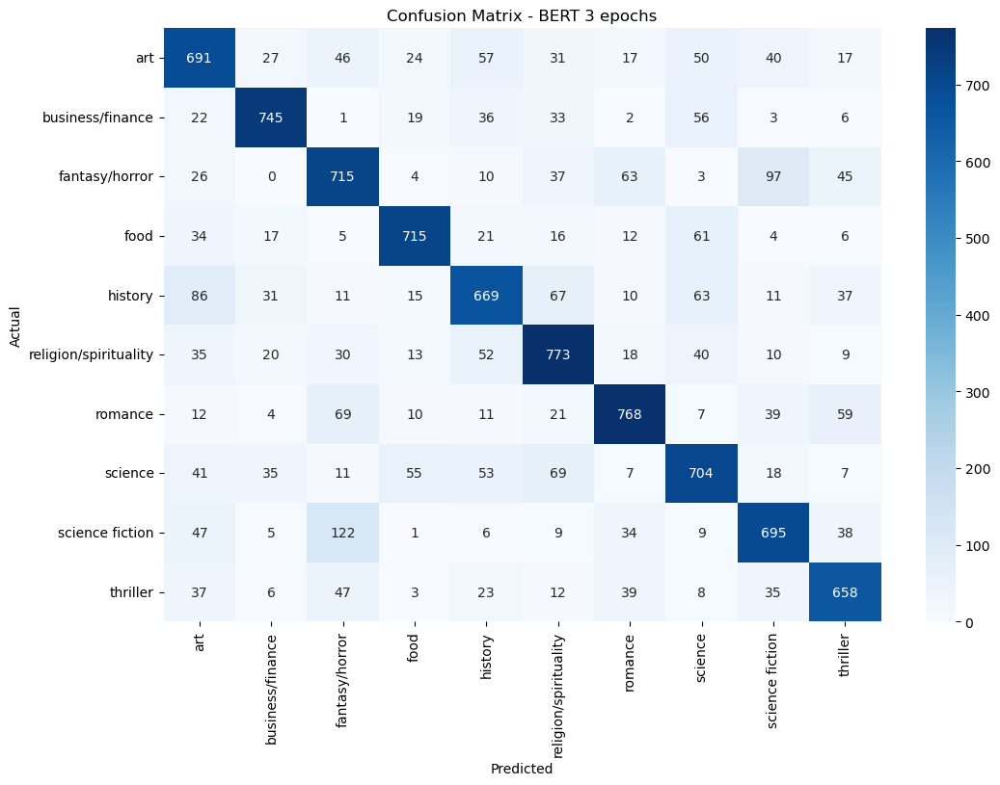

In [74]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_pred_bert, labels=range(len(le.classes_)))

plt.figure(figsize=(12,8))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    xticklabels=le.classes_,  # These are category names
    yticklabels=le.classes_,  # Same here
    cmap='Blues'
)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - BERT 3 epochs')
plt.show()


In [96]:
# Experiment using the BERT - fine tuning initial call

# bert Model
bert_model_4_epochs = "bert-base-uncased"

tokenizer_bert_4_epochs = AutoTokenizer.from_pretrained(bert_model_4_epochs)

def tokenize(batch):
    return tokenizer_bert_4_epochs(batch['text'], padding='max_length', truncation=True, max_length=256)

train_dataset = train_dataset.map(tokenize, batched=True)
test_dataset  = test_dataset.map(tokenize, batched=True)

train_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
test_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])

# Load model
num_labels = len(le.classes_)
model = AutoModelForSequenceClassification.from_pretrained(bert_model_4_epochs, num_labels=num_labels)

# Training config
training_args = TrainingArguments(
    output_dir="./results",
    do_eval=True,   
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,   
    metric_for_best_model="f1", 
    greater_is_better=True,
    num_train_epochs=4,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    learning_rate=2e-5,
    weight_decay=0.01,
    warmup_ratio=0.1, 
    logging_dir="./logs",
    logging_steps=100,
    save_total_limit=2,
    report_to="none" 
)

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    return {
        "accuracy": accuracy_score(labels, preds),
        "precision": precision_score(labels, preds, average="weighted"),
        "recall": recall_score(labels, preds, average="weighted"),
        "f1": f1_score(labels, preds, average="weighted"),
    }


# Trainer
trainer_bert_4_epochs = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    tokenizer=tokenizer_bert_4_epochs,
    compute_metrics=compute_metrics 
)

# Train
trainer_bert_4_epochs.train()


Map:   0%|          | 0/38592 [00:00<?, ? examples/s]

Map:   0%|          | 0/9648 [00:00<?, ? examples/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/var/folders/gs/rm1mjp5x5ybc93h8m4xwbfyr0000gn/T/ipykernel_13887/1370488467.py:54: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer_bert_4_epochs = Trainer(
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.841900,0.872451,0.714863,0.722703,0.714863,0.714925
2,0.688700,0.857326,0.732483,0.738608,0.732483,0.733932
3,0.453600,1.027509,0.732172,0.736407,0.732172,0.733088
4,0.199400,1.263660,0.730307,0.731689,0.730307,0.730808


/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


TrainOutput(global_step=19296, training_loss=0.6131308791451588, metrics={'train_runtime': 12104.7596, 'train_samples_per_second': 12.753, 'train_steps_per_second': 1.594, 'total_flos': 2.0309422392999936e+16, 'train_loss': 0.6131308791451588, 'epoch': 4.0})

In [97]:
# Evaluate Bert Model
preds_output_bert_4_epochs = trainer_bert_4_epochs.predict(test_dataset)
y_pred_bert_4_epochs = preds_output_bert_4_epochs.predictions.argmax(axis=1)
print(classification_report(y_test, y_pred_bert_4_epochs, target_names=le.classes_))

/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


                       precision    recall  f1-score   support

                  art       0.63      0.71      0.67      1000
     business/finance       0.85      0.77      0.81       923
       fantasy/horror       0.66      0.72      0.69      1000
                 food       0.83      0.80      0.81       891
              history       0.64      0.73      0.68      1000
religion/spirituality       0.72      0.77      0.74      1000
              romance       0.83      0.73      0.78      1000
              science       0.75      0.66      0.70      1000
      science fiction       0.74      0.72      0.73       966
             thriller       0.75      0.73      0.74       868

             accuracy                           0.73      9648
            macro avg       0.74      0.73      0.74      9648
         weighted avg       0.74      0.73      0.73      9648



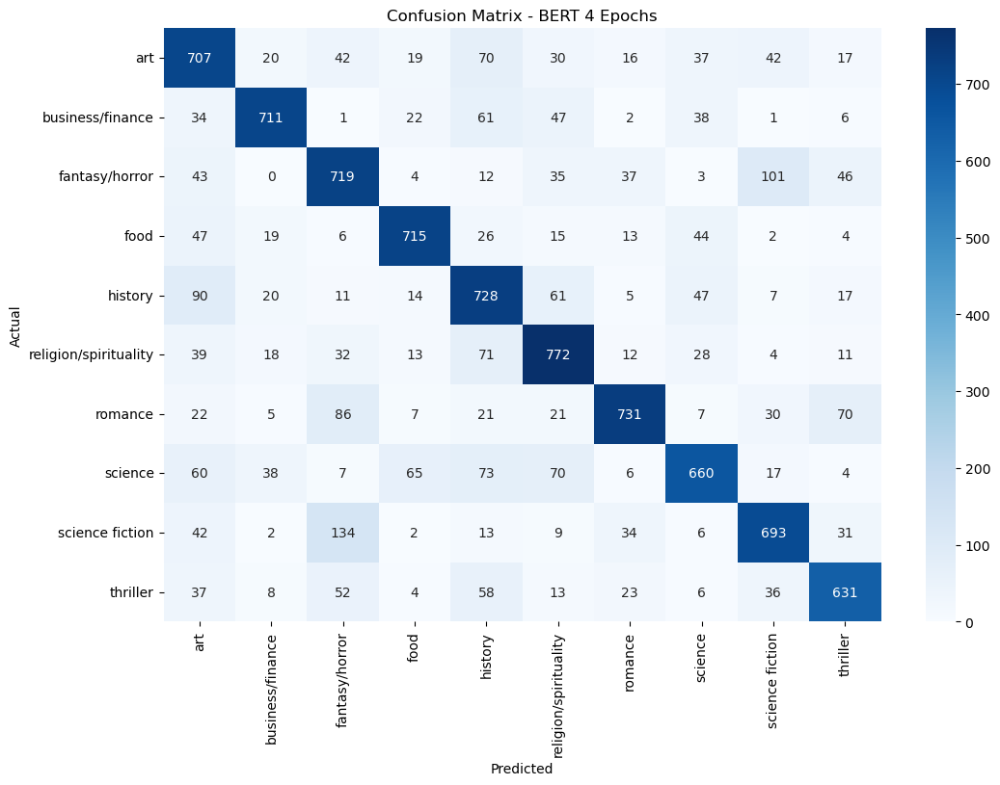

In [98]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_pred_bert_4_epochs, labels=range(len(le.classes_)))

plt.figure(figsize=(12,8))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    xticklabels=le.classes_,  # These are category names
    yticklabels=le.classes_,  # Same here
    cmap='Blues'
)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - BERT 4 Epochs')
plt.show()


In [51]:
# Experiment using the BERT - fine tuning initial call

# BERT Model
bert_model_5_epochs = "bert-base-uncased"

tokenizer_bert_5_epochs = AutoTokenizer.from_pretrained(bert_model_5_epochs)

def tokenize(batch):
    return tokenizer_bert_5_epochs(batch['text'], padding='max_length', truncation=True, max_length=256)

train_dataset = train_dataset.map(tokenize, batched=True)
test_dataset  = test_dataset.map(tokenize, batched=True)

train_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
test_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])

# Load model
num_labels = len(le.classes_)
model = AutoModelForSequenceClassification.from_pretrained(bert_model_4_epochs, num_labels=num_labels)

# Training config
training_args = TrainingArguments(
    output_dir="./results",
    do_eval=True,   
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,   
    metric_for_best_model="f1", 
    greater_is_better=True,
    num_train_epochs=5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    learning_rate=2e-5,
    weight_decay=0.01,
    warmup_ratio=0.1, 
    logging_dir="./logs",
    logging_steps=100,
    save_total_limit=2,
    report_to="none" 
)

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    return {
        "accuracy": accuracy_score(labels, preds),
        "precision": precision_score(labels, preds, average="weighted"),
        "recall": recall_score(labels, preds, average="weighted"),
        "f1": f1_score(labels, preds, average="weighted"),
    }


# Trainer
trainer_bert_5_epochs = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    tokenizer=tokenizer_bert_5_epochs,
    compute_metrics=compute_metrics 
)

# Train
trainer_bert_5_epochs.train()


Map:   0%|          | 0/38592 [00:00<?, ? examples/s]

Map:   0%|          | 0/9648 [00:00<?, ? examples/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/var/folders/gs/rm1mjp5x5ybc93h8m4xwbfyr0000gn/T/ipykernel_13887/1726257786.py:54: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer_bert_5_epochs = Trainer(
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.846100,0.888996,0.715796,0.723652,0.715796,0.714865
2,0.709100,0.853451,0.735593,0.741026,0.735593,0.736922
3,0.475700,1.008474,0.732483,0.737892,0.732483,0.733191
4,0.207200,1.363693,0.731447,0.732667,0.731447,0.731499
5,0.208900,1.560025,0.729478,0.730263,0.729478,0.729653


/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


TrainOutput(global_step=24120, training_loss=0.5384492676946061, metrics={'train_runtime': 14022.2675, 'train_samples_per_second': 13.761, 'train_steps_per_second': 1.72, 'total_flos': 2.538677799124992e+16, 'train_loss': 0.5384492676946061, 'epoch': 5.0})

In [52]:
# Evaluate Bert Model
preds_output_bert_5_epochs = trainer_bert_5_epochs.predict(test_dataset)
y_pred_bert_5_epochs = preds_output_bert_5_epochs.predictions.argmax(axis=1)
print(classification_report(y_test, y_pred_bert_5_epochs, target_names=le.classes_))

/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


                       precision    recall  f1-score   support

                  art       0.65      0.69      0.67      1000
     business/finance       0.86      0.76      0.81       923
       fantasy/horror       0.66      0.73      0.69      1000
                 food       0.81      0.81      0.81       891
              history       0.65      0.73      0.69      1000
religion/spirituality       0.73      0.77      0.75      1000
              romance       0.83      0.73      0.78      1000
              science       0.74      0.68      0.71      1000
      science fiction       0.76      0.72      0.74       966
             thriller       0.74      0.73      0.73       868

             accuracy                           0.74      9648
            macro avg       0.74      0.74      0.74      9648
         weighted avg       0.74      0.74      0.74      9648



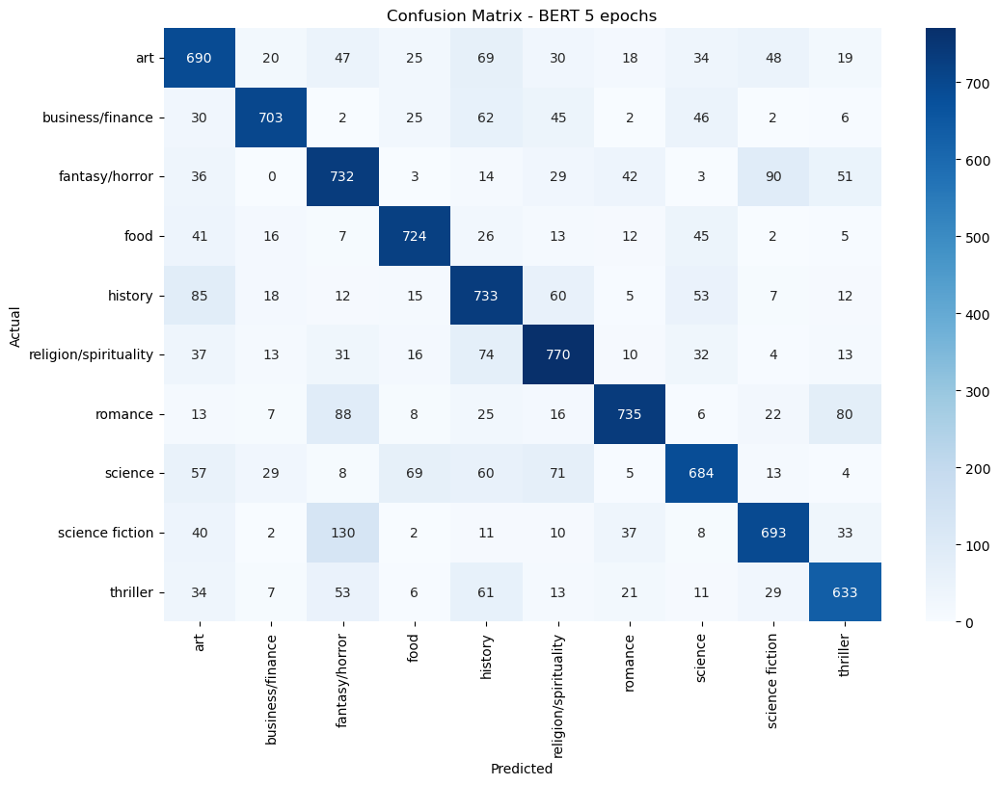

In [81]:
# Confusion matrix
cm = confusion_matrix(y_test, y_pred_bert_5_epochs, labels=range(len(le.classes_)))
plt.figure(figsize=(12,8))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_,
            yticklabels=le.classes_, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - BERT 5 epochs')
plt.show()

In [53]:
# Experiment using the roBERTa - fine tuning initial call

# roberta Model
roberta_model_4_epochs = "roberta-base"

tokenizer_robert_4_epochs = AutoTokenizer.from_pretrained(roberta_model_4_epochs)

def tokenize(batch):
    return tokenizer_robert_4_epochs(batch['text'], padding='max_length', truncation=True, max_length=256)

train_dataset = train_dataset.map(tokenize, batched=True)
test_dataset  = test_dataset.map(tokenize, batched=True)

train_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
test_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])

# Load model
num_labels = len(le.classes_)
model = AutoModelForSequenceClassification.from_pretrained(roberta_model_4_epochs, num_labels=num_labels)

# Training config
training_args = TrainingArguments(
    output_dir="./results",
    do_eval=True,   
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,   
    metric_for_best_model="f1", 
    greater_is_better=True,
    num_train_epochs=4,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    learning_rate=2e-5,
    weight_decay=0.01,
    warmup_ratio=0.1, 
    logging_dir="./logs",
    logging_steps=100,
    save_total_limit=2,
    report_to="none" 
)

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    return {
        "accuracy": accuracy_score(labels, preds),
        "precision": precision_score(labels, preds, average="weighted"),
        "recall": recall_score(labels, preds, average="weighted"),
        "f1": f1_score(labels, preds, average="weighted"),
    }


# Trainer
trainer_robert_4_epochs = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    tokenizer=tokenizer_robert_4_epochs,
    compute_metrics=compute_metrics 
)

# Train
trainer_robert_4_epochs.train()


Map:   0%|          | 0/38592 [00:00<?, ? examples/s]

Map:   0%|          | 0/9648 [00:00<?, ? examples/s]

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/var/folders/gs/rm1mjp5x5ybc93h8m4xwbfyr0000gn/T/ipykernel_13887/2482755446.py:54: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer_robert_4_epochs = Trainer(
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.889200,0.873174,0.713308,0.717416,0.713308,0.712884
2,0.764400,0.905117,0.720357,0.732148,0.720357,0.722092
3,0.566900,0.921354,0.735697,0.738990,0.735697,0.736242
4,0.377600,1.052941,0.736629,0.737970,0.736629,0.736854


/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


TrainOutput(global_step=19296, training_loss=0.7094653329841335, metrics={'train_runtime': 15317.2363, 'train_samples_per_second': 10.078, 'train_steps_per_second': 1.26, 'total_flos': 2.0309422392999936e+16, 'train_loss': 0.7094653329841335, 'epoch': 4.0})

In [54]:
# Evaluate Bert Model
preds_output_roberta_4_epochs = trainer_robert_4_epochs.predict(test_dataset)
y_pred_roberta_4_epochs = preds_output_roberta_4_epochs.predictions.argmax(axis=1)
print(classification_report(y_test, y_pred_roberta_4_epochs, target_names=le.classes_))

/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


                       precision    recall  f1-score   support

                  art       0.68      0.71      0.69      1000
     business/finance       0.81      0.82      0.82       923
       fantasy/horror       0.66      0.71      0.69      1000
                 food       0.84      0.79      0.81       891
              history       0.70      0.67      0.69      1000
religion/spirituality       0.75      0.74      0.75      1000
              romance       0.77      0.76      0.77      1000
              science       0.73      0.71      0.72      1000
      science fiction       0.74      0.68      0.71       966
             thriller       0.72      0.76      0.74       868

             accuracy                           0.74      9648
            macro avg       0.74      0.74      0.74      9648
         weighted avg       0.74      0.74      0.74      9648



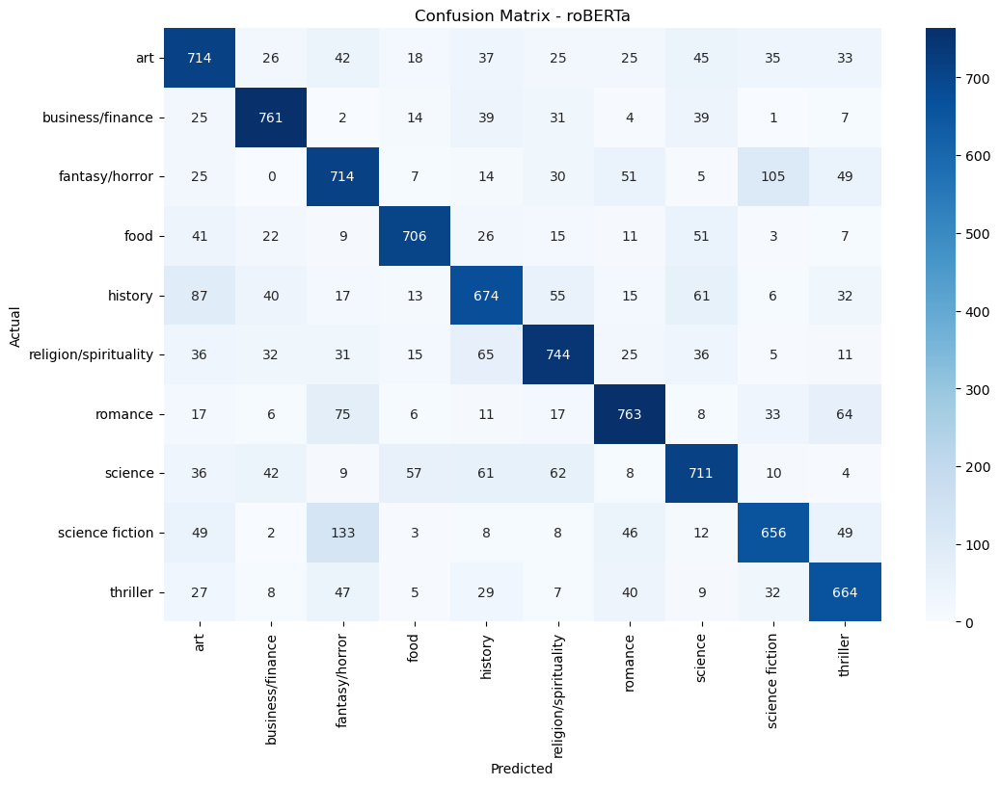

In [82]:
# Confusion matrix
cm = confusion_matrix(y_test, y_pred_roberta_4_epochs, labels=range(len(le.classes_)))
plt.figure(figsize=(12,8))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_,
            yticklabels=le.classes_, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - roBERTa')
plt.show()

In [141]:
import torch
torch.cuda.empty_cache()      # for CUDA (safe to call even if not using GPU)
torch.mps.empty_cache()       # clears MPS GPU memory

import gc
gc.collect()

10334

In [81]:
# Experiment using the roBERTa - fine tuning initial call

# roberta Model
roberta_model_2_epochs = "roberta-base"

tokenizer_roberta_2_epochs = AutoTokenizer.from_pretrained(roberta_model_2_epochs)

def tokenize(batch):
    return tokenizer_roberta_2_epochs(batch['text'], padding='max_length', truncation=True, max_length=256)

train_dataset = train_dataset.map(tokenize, batched=True)
test_dataset  = test_dataset.map(tokenize, batched=True)

train_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
test_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
# Load model
num_labels = len(le.classes_)
model = AutoModelForSequenceClassification.from_pretrained(roberta_model_2_epochs, num_labels=num_labels)

# Training config
training_args = TrainingArguments(
    output_dir="./results",
    do_eval=True,   
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,   
    metric_for_best_model="f1", 
    greater_is_better=True,
    num_train_epochs=2,
    per_device_train_batch_size=2,
    per_device_eval_batch_size=8,
    gradient_accumulation_steps=2,
    learning_rate=2e-5,
    weight_decay=0.01,
    warmup_ratio=0.1, 
    logging_dir="./logs",
    logging_steps=100,
    save_total_limit=2,
    report_to="none" 
)

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    return {
        "accuracy": accuracy_score(labels, preds),
        "precision": precision_score(labels, preds, average="weighted"),
        "recall": recall_score(labels, preds, average="weighted"),
        "f1": f1_score(labels, preds, average="weighted"),
    }


# Trainer
trainer_roberta_2_epochs = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    tokenizer=tokenizer_roberta_2_epochs,
    compute_metrics=compute_metrics 
)

# Train
trainer_roberta_2_epochs.train()


Map:   0%|          | 0/38592 [00:00<?, ? examples/s]

Map:   0%|          | 0/9648 [00:00<?, ? examples/s]

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/var/folders/gs/rm1mjp5x5ybc93h8m4xwbfyr0000gn/T/ipykernel_1411/787961100.py:54: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer_roberta_2_epochs = Trainer(
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.942300,0.930264,0.712376,0.721594,0.712376,0.712353
2,0.672400,0.979918,0.733313,0.735485,0.733313,0.734042


/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


TrainOutput(global_step=19296, training_loss=0.930682734075075, metrics={'train_runtime': 7780.2588, 'train_samples_per_second': 9.92, 'train_steps_per_second': 2.48, 'total_flos': 1.0154711196499968e+16, 'train_loss': 0.930682734075075, 'epoch': 2.0})

In [82]:
# Evaluate Bert Model
preds_output_roberta_2_epochs = trainer_roberta_2_epochs.predict(test_dataset)
y_pred_roberta_2_epochs = preds_output_roberta_2_epochs.predictions.argmax(axis=1)
print(classification_report(y_test, y_pred_roberta_2_epochs, target_names=le.classes_))

/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


                       precision    recall  f1-score   support

                  art       0.67      0.70      0.68      1000
     business/finance       0.84      0.80      0.82       923
       fantasy/horror       0.65      0.70      0.67      1000
                 food       0.86      0.80      0.83       891
              history       0.68      0.69      0.68      1000
religion/spirituality       0.76      0.74      0.75      1000
              romance       0.76      0.77      0.77      1000
              science       0.71      0.71      0.71      1000
      science fiction       0.72      0.67      0.70       966
             thriller       0.73      0.75      0.74       868

             accuracy                           0.73      9648
            macro avg       0.74      0.73      0.74      9648
         weighted avg       0.74      0.73      0.73      9648



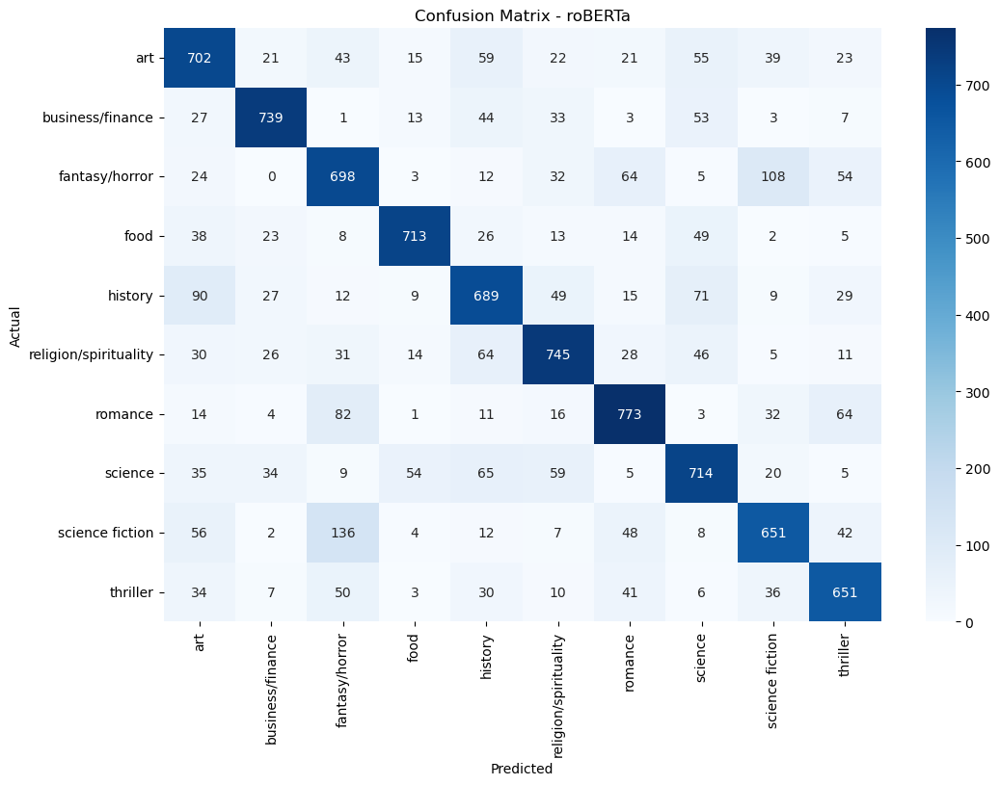

In [83]:
# Confusion matrix

cm = confusion_matrix(y_test, y_pred_roberta_2_epochs, labels=range(len(le.classes_)))
plt.figure(figsize=(12,8))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_,
            yticklabels=le.classes_, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - roBERTa')
plt.show()

In [87]:
# Experiment using the roBERTa - fine tuning 2 epochs and decrease learning rate

# roberta Model
roberta_model_1e5_epochs = "roberta-base"

tokenizer_roberta_1e5_epochs = AutoTokenizer.from_pretrained(roberta_model_1e5_epochs)

def tokenize(batch):
    return tokenizer_roberta_1e5_epochs(batch['text'], padding='max_length', truncation=True, max_length=256)

train_dataset = train_dataset.map(tokenize, batched=True)
test_dataset  = test_dataset.map(tokenize, batched=True)

train_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
test_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
# Load model
num_labels = len(le.classes_)
model = AutoModelForSequenceClassification.from_pretrained(roberta_model_1e5_epochs, num_labels=num_labels)

# Training config
training_args = TrainingArguments(
    output_dir="./results",
    do_eval=True,   
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,   
    metric_for_best_model="f1", 
    greater_is_better=True,
    num_train_epochs=2,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    learning_rate=1e-5,
    weight_decay=0.01,
    warmup_ratio=0.1, 
    logging_dir="./logs",
    logging_steps=100,
    save_total_limit=2,
    report_to="none" 
)

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    return {
        "accuracy": accuracy_score(labels, preds),
        "precision": precision_score(labels, preds, average="weighted"),
        "recall": recall_score(labels, preds, average="weighted"),
        "f1": f1_score(labels, preds, average="weighted"),
    }


# Trainer
trainer_roberta_1e5_epochs = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    tokenizer=tokenizer_roberta_1e5_epochs,
    compute_metrics=compute_metrics 
)

# Train
trainer_roberta_1e5_epochs.train()


Map:   0%|          | 0/38592 [00:00<?, ? examples/s]

Map:   0%|          | 0/9648 [00:00<?, ? examples/s]

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/var/folders/gs/rm1mjp5x5ybc93h8m4xwbfyr0000gn/T/ipykernel_1411/2806494177.py:53: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer_roberta_1e5_epochs = Trainer(
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.872900,0.864205,0.714760,0.721952,0.714760,0.714780
2,0.761700,0.825217,0.733209,0.735516,0.733209,0.734027


/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


TrainOutput(global_step=9648, training_loss=0.9013855789431292, metrics={'train_runtime': 5691.6643, 'train_samples_per_second': 13.561, 'train_steps_per_second': 1.695, 'total_flos': 1.0154711196499968e+16, 'train_loss': 0.9013855789431292, 'epoch': 2.0})

In [100]:
# Evaluate roBERTa Model
preds_output_roberta_1e5_epochs = trainer_roberta_1e5_epochs.predict(test_dataset)
y_pred_roberta_1e5_epochs = preds_output_roberta_1e5_epochs.predictions.argmax(axis=1)
print(classification_report(y_test, y_pred_roberta_1e5_epochs, target_names=le.classes_))

/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


                       precision    recall  f1-score   support

                  art       0.67      0.69      0.68      1000
     business/finance       0.85      0.80      0.83       923
       fantasy/horror       0.66      0.68      0.67      1000
                 food       0.86      0.79      0.82       891
              history       0.67      0.70      0.68      1000
religion/spirituality       0.74      0.76      0.75      1000
              romance       0.78      0.79      0.78      1000
              science       0.70      0.71      0.70      1000
      science fiction       0.71      0.68      0.70       966
             thriller       0.74      0.75      0.74       868

             accuracy                           0.73      9648
            macro avg       0.74      0.73      0.74      9648
         weighted avg       0.74      0.73      0.73      9648



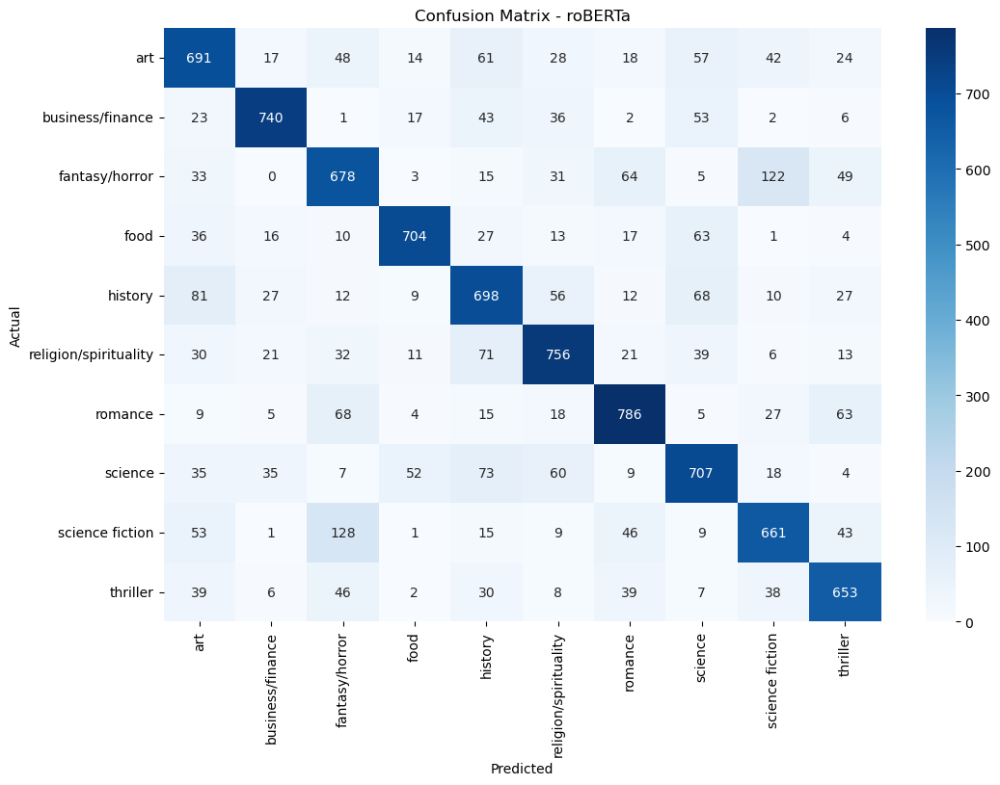

In [101]:
# Confusion matrix

cm = confusion_matrix(y_test, y_pred_roberta_1e5_epochs, labels=range(len(le.classes_)))
plt.figure(figsize=(12,8))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_,
            yticklabels=le.classes_, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - roBERTa')
plt.show()

In [106]:
# Experiment using the roBERTa - fine tuning 2 epochs and increase learning rate

# roberta Model
roberta_model_3e5_epochs = "roberta-base"

tokenizer_roberta_3e5_epochs = AutoTokenizer.from_pretrained(roberta_model_3e5_epochs)

def tokenize(batch):
    return tokenizer_roberta_3e5_epochs(batch['text'], padding='max_length', truncation=True, max_length=256)

train_dataset = train_dataset.map(tokenize, batched=True)
test_dataset  = test_dataset.map(tokenize, batched=True)

train_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
test_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
# Load model
num_labels = len(le.classes_)
model = AutoModelForSequenceClassification.from_pretrained(roberta_model_3e5_epochs, num_labels=num_labels)

# Training config
training_args = TrainingArguments(
    output_dir="./results",
    do_eval=True,   
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,   
    metric_for_best_model="f1", 
    greater_is_better=True,
    num_train_epochs=2,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    learning_rate=3e-5,
    weight_decay=0.01,
    warmup_ratio=0.1, 
    logging_dir="./logs",
    logging_steps=100,
    save_total_limit=2,
    report_to="none" 
)

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    return {
        "accuracy": accuracy_score(labels, preds),
        "precision": precision_score(labels, preds, average="weighted"),
        "recall": recall_score(labels, preds, average="weighted"),
        "f1": f1_score(labels, preds, average="weighted"),
    }


# Trainer
trainer_roberta_3e5_epochs = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    tokenizer=tokenizer_roberta_3e5_epochs,
    compute_metrics=compute_metrics 
)

# Train
trainer_roberta_3e5_epochs.train()


Map:   0%|          | 0/38592 [00:00<?, ? examples/s]

Map:   0%|          | 0/9648 [00:00<?, ? examples/s]

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/var/folders/gs/rm1mjp5x5ybc93h8m4xwbfyr0000gn/T/ipykernel_1411/2413969237.py:53: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer_roberta_3e5_epochs = Trainer(
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.887000,0.871581,0.711857,0.718353,0.711857,0.712387
2,0.697100,0.843792,0.735489,0.737337,0.735489,0.736130


/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


TrainOutput(global_step=9648, training_loss=0.8745172510099648, metrics={'train_runtime': 5869.6231, 'train_samples_per_second': 13.15, 'train_steps_per_second': 1.644, 'total_flos': 1.0154711196499968e+16, 'train_loss': 0.8745172510099648, 'epoch': 2.0})

In [110]:
# Evaluate roBERTa Model
preds_output_roberta_3e5_epochs = trainer_roberta_3e5_epochs.predict(test_dataset)
y_pred_roberta_3e5_epochs = preds_output_roberta_3e5_epochs.predictions.argmax(axis=1)
print(classification_report(y_test, y_pred_roberta_3e5_epochs, target_names=le.classes_))

/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


                       precision    recall  f1-score   support

                  art       0.67      0.69      0.68      1000
     business/finance       0.84      0.80      0.82       923
       fantasy/horror       0.67      0.69      0.68      1000
                 food       0.86      0.79      0.83       891
              history       0.68      0.71      0.70      1000
religion/spirituality       0.74      0.76      0.75      1000
              romance       0.76      0.79      0.77      1000
              science       0.71      0.70      0.71      1000
      science fiction       0.72      0.70      0.71       966
             thriller       0.75      0.74      0.74       868

             accuracy                           0.74      9648
            macro avg       0.74      0.74      0.74      9648
         weighted avg       0.74      0.74      0.74      9648



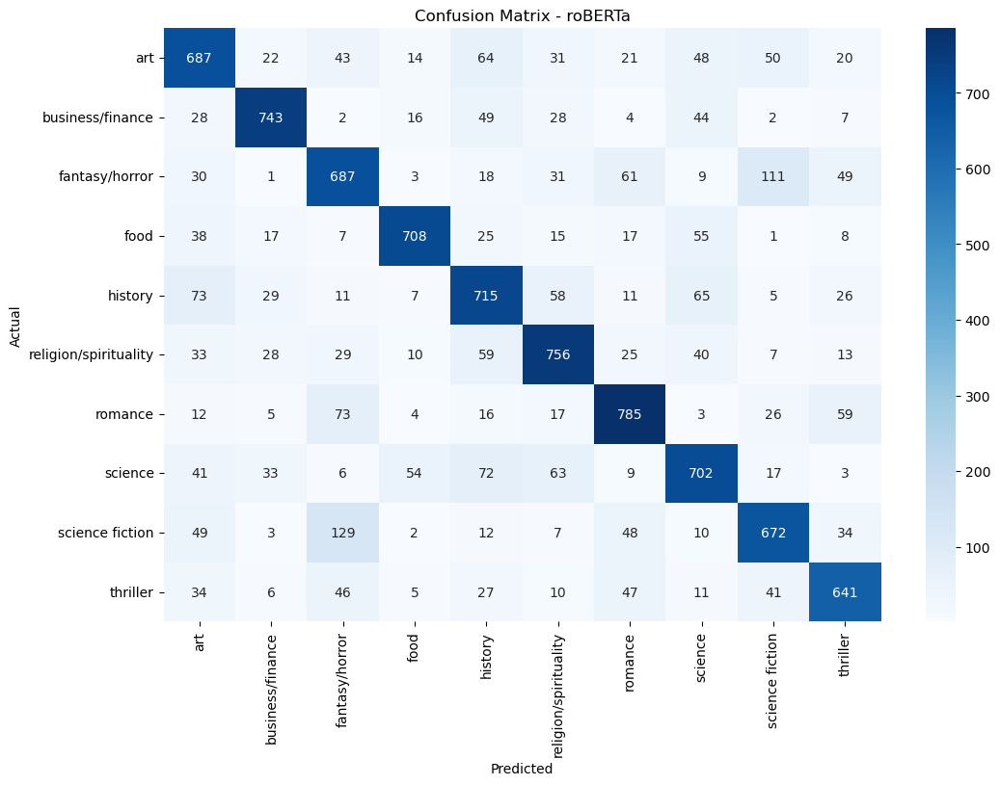

In [111]:
# Confusion matrix

cm = confusion_matrix(y_test, y_pred_roberta_3e5_epochs, labels=range(len(le.classes_)))
plt.figure(figsize=(12,8))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_,
            yticklabels=le.classes_, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - roBERTa')
plt.show()

In [121]:
# Experiment using the BERT

# BERT Model
bert_1e5_model = "bert-base-uncased"

tokenizer_1e5_bert = AutoTokenizer.from_pretrained(bert_1e5_model)

def tokenize(batch):
    return tokenizer_1e5_bert(batch['text'], padding='max_length', truncation=True, max_length=256)

train_dataset = train_dataset.map(tokenize, batched=True)
test_dataset  = test_dataset.map(tokenize, batched=True)

train_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
test_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])

# Load model
num_labels = len(le.classes_)
model = AutoModelForSequenceClassification.from_pretrained(bert_1e5_model, num_labels=num_labels)

# Training config
training_args = TrainingArguments(
    output_dir="./results",
    do_eval=True,                 # instead of evaluation_strategy
    num_train_epochs=3,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    learning_rate=1e-5,
    weight_decay=0.01,
    logging_dir="./logs",
    logging_steps=100
)


# Trainer
trainer_bert_1e5_epochs = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    tokenizer=tokenizer_1e5_bert
)

# Train
trainer_bert_1e5_epochs.train()

Map:   0%|          | 0/38592 [00:00<?, ? examples/s]

Map:   0%|          | 0/9648 [00:00<?, ? examples/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/var/folders/gs/rm1mjp5x5ybc93h8m4xwbfyr0000gn/T/ipykernel_1411/782830803.py:36: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer_bert_1e5_epochs = Trainer(
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Step,Training Loss
100,2.255700
200,1.896000
300,1.544700
400,1.354200
500,1.251300
600,1.192500
700,1.074700
800,1.084700
900,1.003100
1000,1.016600


/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


TrainOutput(global_step=14472, training_loss=0.7232506637615417, metrics={'train_runtime': 15324.2093, 'train_samples_per_second': 7.555, 'train_steps_per_second': 0.944, 'total_flos': 1.5232066794749952e+16, 'train_loss': 0.7232506637615417, 'epoch': 3.0})

In [122]:
# Evaluate BERT Model
preds_output_bert_1e5_epochs = trainer_bert_1e5_epochs.predict(test_dataset)
y_pred_bert_1e5_epochs = preds_output_bert_1e5_epochs.predictions.argmax(axis=1)
print(classification_report(y_test, y_pred_bert_1e5_epochs, target_names=le.classes_))

/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


                       precision    recall  f1-score   support

                  art       0.67      0.71      0.69      1000
     business/finance       0.84      0.80      0.82       923
       fantasy/horror       0.65      0.72      0.68      1000
                 food       0.84      0.80      0.82       891
              history       0.71      0.67      0.69      1000
religion/spirituality       0.74      0.76      0.75      1000
              romance       0.80      0.77      0.79      1000
              science       0.71      0.71      0.71      1000
      science fiction       0.75      0.69      0.72       966
             thriller       0.73      0.76      0.74       868

             accuracy                           0.74      9648
            macro avg       0.74      0.74      0.74      9648
         weighted avg       0.74      0.74      0.74      9648



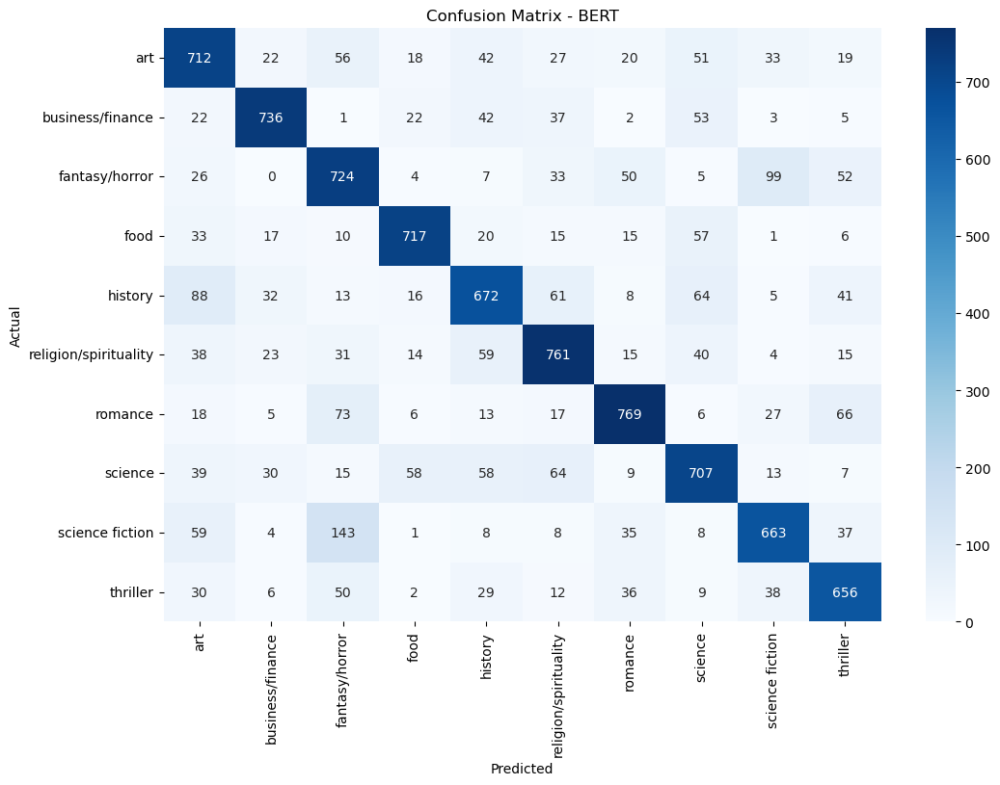

In [123]:
# Confusion matrix

cm = confusion_matrix(y_test, y_pred_bert_1e5_epochs, labels=range(len(le.classes_)))
plt.figure(figsize=(12,8))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_,
            yticklabels=le.classes_, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - BERT')
plt.show()

# Model Analysis

From the following tuning, it is apparent that the two that should be considered is the BERT model with 3 epochs at a learning rate of 2e-5 and the roBERTa model with 2 epochs at a learning rate of 3e-5. The reason for this is that both contain the greatest separation of the different categories along with both being a reasonable/lesser time to complete the training. This must be taken into account for overall usage. 

## Clustering
Of the two RoBERTa performs better by only slight measure. There is a slightly more distinct separation of classes overall when looking at all the categories. The consistency is also greater with the roBERTa model. The following categories have fewer misclassifications: food, romance, and religion/spirituality. Fantasy/horror  and scifi still remain as the most problematic fields in both models. Despite it being slightly less separated in the BERT model over the roBERTa one, the roBERTa one still shows the greater performance between the two. 

## Performace
An interesting thing to note between the two models is that the BERT model performed better in narrative-led/ story-driven categories such as Thriller, SciFi, Art(which included multiple story-driven forms like comics) and Fantasy/Horror. The roBERTA modelhad an edge t more factual driven categories such as Business/Finance, Food, History, and Science. So the BERT model has an edge on more narrative/stylistic synopsis while BERT has an edge of fact base synopsis. 


## Time
The biggest difference between the two models lies in the timing it takes to train the model. For the BERT model it took 2:12:35 for completion of the model's training. For the roBERTa model it took 1:37:46 which is close to erasing 1/4th of the time that it took the BERT model. This is a significant difference and should be considered in the finalizing of the model for the capstone.




# Comparison with External Sources
## "Book Genre Classification" Repository
[Book Genre Classification Repo](https://github.com/akshaybhatia10/Book-Genre-Classification)

In this repository, we see that dataset and project are similar in nature. The developer according to their [README](https://github.com/akshaybhatia10/Book-Genre-Classification/blob/master/README.md) used real data provided to them which included up to 31 genres. The raw data was not balanced, but instead pulled in and used according to findings inside the repository [here](https://github.com/akshaybhatia10/Book-Genre-Classification/blob/master/learn_embeddings.py). Yet the models that they used were pulling 0.58 - 0.64 overall accuracy which is impressive considering the number of categories they are differentiating books via title into. To see the work in the respository please click [HERE](https://github.com/akshaybhatia10/Book-Genre-Classification/blob/master/Best_TFIDF-Vectorizer_model.ipynb) While this repository does suggest that incorporating title and author may further improve performance, the current project’s roBERTa-based approach already achieves a significantly stronger performance of 0.74 accuracy with fewer classes. As such, the present results are comparable and competitive. This capstone demonstrates effectiveness at the genre classification task under a more constrained label set and the addition of descriptions. Though it should be tested using similar metadata as presented in the classification repository to see if improvements can be made to the 2 models prior to finalization.

## "Book Genre Preditior" Repository
[Book Genre Predictor](https://github.com/obaidtambo/books_genre_predictor/blob/main/Books%20Genre%20Prediction.ipynb)

In this repository, the dataset which was posted on [Kaggle](https://www.kaggle.com/code/lomero/aann-22-23-lab-07-training) is nearly the same project that is being done in this capstone. The metadata included contains analysis of the title and the description which is close to the capstone project presented. Like the previous project, there was no balancing of the data input into the model. The ten classes, similar to my own ten classes, were distributed unevenly prior to running. This resulted in 6 strongly trained classes and 4 weakly trained classes. The final accuracy score after 10 epochs resulted in 0.76 which is slightly higher than the 0.74. The difference in scores suggests that incorporating additional metadata or book information may enhance this project’s final model performance and help boost overall accuracy. However, the the final scoring is similar to that of what this capstone has achieved. The word cloud also was an interest concept that can be applied to this capstone for a clear visualization.
 

# Expand metadata of roBERTa and BERT models 
### Prior to finalized submission, metadata such title and author will also be considered as seen in external projects above.


In [11]:
# Prepare data
le = LabelEncoder()
df_balanced['label'] = le.fit_transform(df_balanced['category'])

# Include title and author metadata
df_balanced['full_text'] = (
    df_balanced['title'] + ' by ' +
    df_balanced['authors'] + ': ' +
    df_balanced['description']
)

# Ensure correct column name
X_train, X_test, y_train, y_test = train_test_split(
    df_balanced['full_text'],
    df_balanced['label'],
    test_size=0.2,
    stratify=df_balanced['label'],
    random_state=42
)

# Convert to Hugging Face Datasets
train_dataset = Dataset.from_dict({'text': X_train.tolist(), 'label': y_train.tolist()})
test_dataset  = Dataset.from_dict({'text': X_test.tolist(),  'label': y_test.tolist()})

In [13]:
# BERT Model - include metadata
bert_model = "bert-base-uncased"

tokenizer_bert = AutoTokenizer.from_pretrained(bert_model)

def tokenize(batch):
    return tokenizer_bert(batch['text'], padding='max_length', truncation=True, max_length=256)

train_dataset = train_dataset.map(tokenize, batched=True)
test_dataset  = test_dataset.map(tokenize, batched=True)

train_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
test_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])

# Load model
num_labels = len(le.classes_)
model = AutoModelForSequenceClassification.from_pretrained(bert_model, num_labels=num_labels)

# Training config
training_args = TrainingArguments(
    output_dir="./results",
    do_eval=True,                 # instead of evaluation_strategy
    num_train_epochs=3,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    learning_rate=2e-5,
    weight_decay=0.01,
    logging_dir="./logs",
    logging_steps=100
)


# Trainer
trainer_bert = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    tokenizer=tokenizer_bert
)

# Train
trainer_bert.train()

Map:   0%|          | 0/38592 [00:00<?, ? examples/s]

Map:   0%|          | 0/9648 [00:00<?, ? examples/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/var/folders/gs/rm1mjp5x5ybc93h8m4xwbfyr0000gn/T/ipykernel_39631/1844914213.py:34: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer_bert = Trainer(
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Step,Training Loss
100,2.168400
200,1.626500
300,1.251500
400,1.127400
500,1.054600
600,1.067700
700,0.940500
800,0.973200
900,0.899100
1000,0.931600


/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


TrainOutput(global_step=14472, training_loss=0.6096366714416386, metrics={'train_runtime': 8153.9508, 'train_samples_per_second': 14.199, 'train_steps_per_second': 1.775, 'total_flos': 1.5232066794749952e+16, 'train_loss': 0.6096366714416386, 'epoch': 3.0})

In [48]:
# Evaluate BERT Model
preds_output_bert_epochs = trainer_bert.predict(test_dataset)
y_pred_bert_epochs = preds_output_bert_epochs.predictions.argmax(axis=1)
print(classification_report(y_test, y_pred_bert_epochs, target_names=le.classes_))

/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


                       precision    recall  f1-score   support

                  art       0.70      0.73      0.72      1000
     business/finance       0.86      0.82      0.84       923
       fantasy/horror       0.68      0.74      0.70      1000
                 food       0.84      0.82      0.83       891
              history       0.72      0.70      0.71      1000
religion/spirituality       0.75      0.76      0.75      1000
              romance       0.80      0.78      0.79      1000
              science       0.72      0.72      0.72      1000
      science fiction       0.76      0.71      0.74       966
             thriller       0.74      0.79      0.76       868

             accuracy                           0.75      9648
            macro avg       0.76      0.76      0.76      9648
         weighted avg       0.76      0.75      0.75      9648



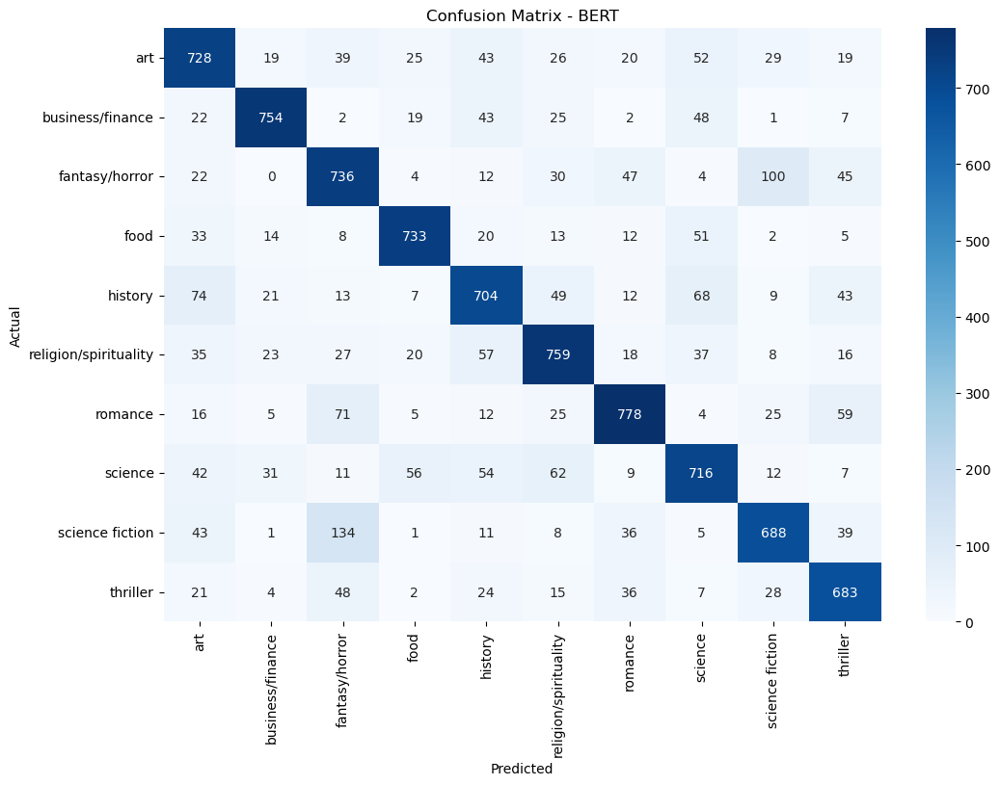

In [49]:
# Confusion matrix BERT

cm = confusion_matrix(y_test, y_pred_bert_epochs, labels=range(len(le.classes_)))
plt.figure(figsize=(12,8))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_,
            yticklabels=le.classes_, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - BERT')
plt.show()

In [24]:
# Experiment using the roBERTa - include metadata

# roberta Model
roberta_model_epochs = "roberta-base"

tokenizer_roberta_epochs = AutoTokenizer.from_pretrained(roberta_model_epochs)

def tokenize(batch):
    return tokenizer_roberta_epochs(batch['text'], padding='max_length', truncation=True, max_length=256)

train_dataset = train_dataset.map(tokenize, batched=True)
test_dataset  = test_dataset.map(tokenize, batched=True)

train_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
test_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
# Load model
num_labels = len(le.classes_)
model = AutoModelForSequenceClassification.from_pretrained(roberta_model_epochs, num_labels=num_labels)

# Training config
training_args = TrainingArguments(
    output_dir="./results",
    do_eval=True,   
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,   
    metric_for_best_model="f1", 
    greater_is_better=True,
    num_train_epochs=2,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    learning_rate=3e-5,
    weight_decay=0.01,
    warmup_ratio=0.1, 
    logging_dir="./logs",
    logging_steps=100,
    save_total_limit=2,
    report_to="none" 
)

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    return {
        "accuracy": accuracy_score(labels, preds),
        "precision": precision_score(labels, preds, average="weighted"),
        "recall": recall_score(labels, preds, average="weighted"),
        "f1": f1_score(labels, preds, average="weighted"),
    }


# Trainer
trainer_roberta_epochs = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    tokenizer=tokenizer_roberta_epochs,
    compute_metrics=compute_metrics 
)

# Train
trainer_roberta_epochs.train()

Map:   0%|          | 0/38592 [00:00<?, ? examples/s]

Map:   0%|          | 0/9648 [00:00<?, ? examples/s]

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/var/folders/gs/rm1mjp5x5ybc93h8m4xwbfyr0000gn/T/ipykernel_23156/3650054521.py:53: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer_roberta_epochs = Trainer(
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.813700,0.815609,0.731654,0.738203,0.731654,0.731985
2,0.658800,0.786310,0.751866,0.753384,0.751866,0.752320


/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


TrainOutput(global_step=9648, training_loss=0.8346091583988955, metrics={'train_runtime': 5855.0867, 'train_samples_per_second': 13.182, 'train_steps_per_second': 1.648, 'total_flos': 1.0154711196499968e+16, 'train_loss': 0.8346091583988955, 'epoch': 2.0})

In [32]:
# Evaluate roBERTa Model
preds_output_roberta_epochs = trainer_roberta_epochs.predict(test_dataset)
y_pred_roberta_epochs = preds_output_roberta_epochs.predictions.argmax(axis=1)
print(classification_report(y_test, y_pred_roberta_epochs, target_names=le.classes_))

/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


                       precision    recall  f1-score   support

                  art       0.71      0.72      0.71      1000
     business/finance       0.86      0.82      0.84       923
       fantasy/horror       0.68      0.70      0.69      1000
                 food       0.87      0.81      0.84       891
              history       0.71      0.72      0.71      1000
religion/spirituality       0.75      0.79      0.77      1000
              romance       0.78      0.80      0.79      1000
              science       0.73      0.72      0.73      1000
      science fiction       0.73      0.70      0.72       966
             thriller       0.74      0.76      0.75       868

             accuracy                           0.75      9648
            macro avg       0.76      0.75      0.75      9648
         weighted avg       0.75      0.75      0.75      9648



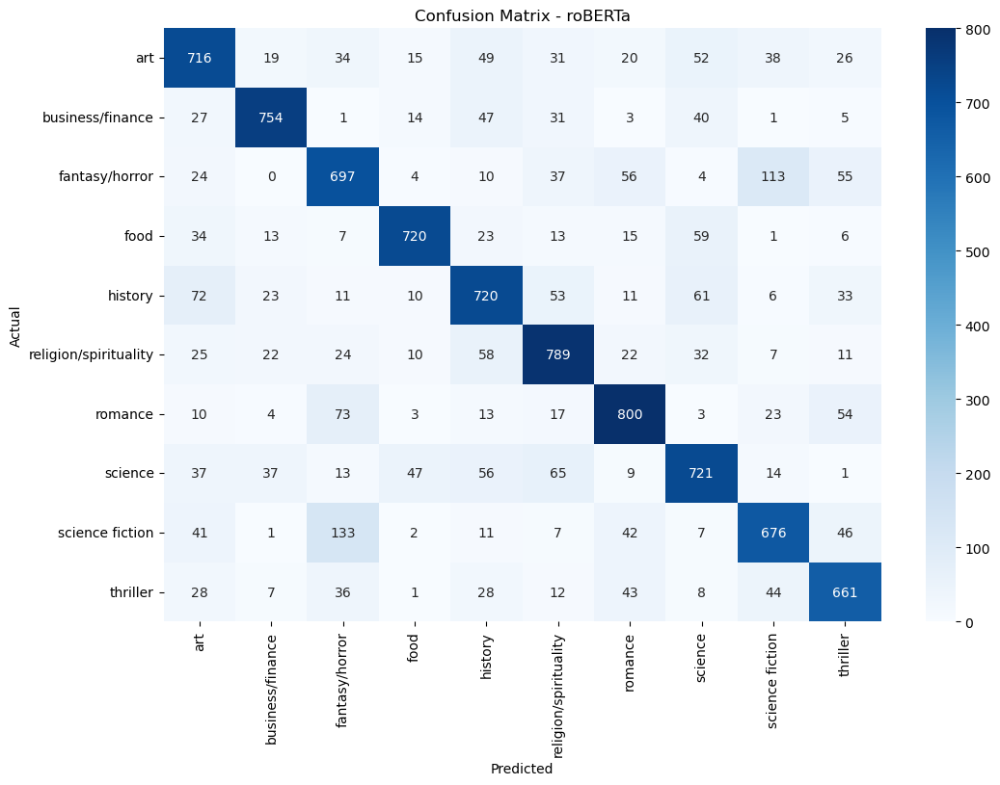

In [34]:
# Confusion matrix roBERTa

cm = confusion_matrix(y_test, y_pred_roberta_epochs, labels=range(len(le.classes_)))
plt.figure(figsize=(12,8))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_,
            yticklabels=le.classes_, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - roBERTa')
plt.show()

In [15]:
# Experiment using the roBERTa - include metadata and early stop and rerun 
from transformers import EarlyStoppingCallback

# roberta Model
roberta_model_epochs = "roberta-base"

tokenizer_roberta_epochs = AutoTokenizer.from_pretrained(roberta_model_epochs)

def tokenize(batch):
    return tokenizer_roberta_epochs(batch['text'], padding='max_length', truncation=True, max_length=256)

train_roberta_dataset = train_dataset.map(tokenize, batched=True)
test_roberta_dataset  = test_dataset.map(tokenize, batched=True)

train_roberta_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
test_roberta_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
# Load model
num_labels = len(le.classes_)
model = AutoModelForSequenceClassification.from_pretrained(roberta_model_epochs, num_labels=num_labels)

# Training config
training_args = TrainingArguments(
    output_dir="./results",
    do_eval=True,   
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,   
    metric_for_best_model="f1", 
    greater_is_better=True,
    num_train_epochs=7,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    learning_rate=3e-5,
    weight_decay=0.01,
    warmup_ratio=0.1, 
    logging_dir="./logs",
    logging_steps=100,
    save_total_limit=2,
    report_to="none" 
)

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    return {
        "accuracy": accuracy_score(labels, preds),
        "precision": precision_score(labels, preds, average="weighted"),
        "recall": recall_score(labels, preds, average="weighted"),
        "f1": f1_score(labels, preds, average="weighted"),
    }


# Trainer
trainer_roberta_epochs = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_roberta_dataset,
    eval_dataset=test_roberta_dataset,
    tokenizer=tokenizer_roberta_epochs,
    compute_metrics=compute_metrics,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=1)]
)

# Train
trainer_roberta_epochs.train()

Map:   0%|          | 0/38592 [00:00<?, ? examples/s]

Map:   0%|          | 0/9648 [00:00<?, ? examples/s]

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/var/folders/gs/rm1mjp5x5ybc93h8m4xwbfyr0000gn/T/ipykernel_39631/1027274274.py:54: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer_roberta_epochs = Trainer(
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.889700,0.874784,0.710406,0.721078,0.710406,0.710216
2,0.816100,0.853075,0.734038,0.738318,0.734038,0.734581
3,0.578900,0.867145,0.738806,0.741605,0.738806,0.739202
4,0.416200,1.092670,0.739635,0.742853,0.739635,0.739487
5,0.390700,1.348600,0.744299,0.748117,0.744299,0.744853
6,0.223700,1.589743,0.743263,0.744991,0.743263,0.743760


/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning:

TrainOutput(global_step=28944, training_loss=0.5898084449069548, metrics={'train_runtime': 17298.9188, 'train_samples_per_second': 15.616, 'train_steps_per_second': 1.952, 'total_flos': 3.0464133589499904e+16, 'train_loss': 0.5898084449069548, 'epoch': 6.0})

In [16]:
# Evaluate roBERTa Model
preds_output_roberta_epochs = trainer_roberta_epochs.predict(test_roberta_dataset)
y_pred_roberta_epochs = preds_output_roberta_epochs.predictions.argmax(axis=1)
print(classification_report(y_test, y_pred_roberta_epochs, target_names=le.classes_))

/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


                       precision    recall  f1-score   support

                  art       0.68      0.71      0.70      1000
     business/finance       0.85      0.82      0.84       923
       fantasy/horror       0.63      0.77      0.69      1000
                 food       0.82      0.82      0.82       891
              history       0.73      0.65      0.68      1000
religion/spirituality       0.77      0.73      0.75      1000
              romance       0.80      0.78      0.79      1000
              science       0.69      0.74      0.72      1000
      science fiction       0.76      0.69      0.72       966
             thriller       0.76      0.75      0.76       868

             accuracy                           0.74      9648
            macro avg       0.75      0.75      0.75      9648
         weighted avg       0.75      0.74      0.74      9648



In [28]:
# Experiment using the roBERTa - include metadata and early stop and rerun 
from transformers import EarlyStoppingCallback

# BERT Model - include metadata
bert_model = "bert-base-uncased"

tokenizer_bert_epochs = AutoTokenizer.from_pretrained(bert_model)

def tokenize(batch):
    return tokenizer_bert_epochs(batch['text'], padding='max_length', truncation=True, max_length=256)

train_bert_dataset = train_dataset.map(tokenize, batched=True)
test_bert_dataset  = test_dataset.map(tokenize, batched=True)

train_bert_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
test_bert_dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
# Load model
num_labels = len(le.classes_)
model = AutoModelForSequenceClassification.from_pretrained(bert_model, num_labels=num_labels)

# Training config
training_args = TrainingArguments(
    output_dir="./results",
    do_eval=True,   
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,   
    metric_for_best_model="f1", 
    greater_is_better=True,
    num_train_epochs=7,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    learning_rate=3e-5,
    weight_decay=0.01,
    warmup_ratio=0.1, 
    logging_dir="./logs",
    logging_steps=100,
    save_total_limit=2,
    report_to="none" 
)

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    return {
        "accuracy": accuracy_score(labels, preds),
        "precision": precision_score(labels, preds, average="weighted"),
        "recall": recall_score(labels, preds, average="weighted"),
        "f1": f1_score(labels, preds, average="weighted"),
    }


# Trainer
trainer_bert_epochs = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_bert_dataset,
    eval_dataset=test_bert_dataset,
    tokenizer=tokenizer_bert_epochs,
    compute_metrics=compute_metrics,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=1)]
)

# Train
trainer_bert_epochs.train()

Map:   0%|          | 0/38592 [00:00<?, ? examples/s]

Map:   0%|          | 0/9648 [00:00<?, ? examples/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/var/folders/gs/rm1mjp5x5ybc93h8m4xwbfyr0000gn/T/ipykernel_39631/2063492730.py:54: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer_bert_epochs = Trainer(
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.839900,0.834343,0.726886,0.730602,0.726886,0.726870
2,0.729500,0.855126,0.743056,0.747930,0.743056,0.743871
3,0.454100,0.989866,0.740983,0.745631,0.740983,0.741743


/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


TrainOutput(global_step=14472, training_loss=0.7476655167726735, metrics={'train_runtime': 8551.2376, 'train_samples_per_second': 31.591, 'train_steps_per_second': 3.949, 'total_flos': 1.5232066794749952e+16, 'train_loss': 0.7476655167726735, 'epoch': 3.0})

In [29]:
# Evaluate BERT Model
preds_output_bert_epochs = trainer_bert_epochs.predict(test_bert_dataset)
y_pred_bert_epochs = preds_output_bert_epochs.predictions.argmax(axis=1)
print(classification_report(y_test, y_pred_bert_epochs, target_names=le.classes_))

/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


                       precision    recall  f1-score   support

                  art       0.66      0.70      0.68      1000
     business/finance       0.86      0.79      0.82       923
       fantasy/horror       0.71      0.71      0.71      1000
                 food       0.83      0.81      0.82       891
              history       0.66      0.75      0.70      1000
religion/spirituality       0.73      0.77      0.75      1000
              romance       0.83      0.73      0.78      1000
              science       0.75      0.65      0.70      1000
      science fiction       0.70      0.79      0.74       966
             thriller       0.77      0.73      0.75       868

             accuracy                           0.74      9648
            macro avg       0.75      0.74      0.75      9648
         weighted avg       0.75      0.74      0.74      9648



# Conclusion
Based on the above areas, nearly every category is negliable in terms of performace and clustering. The trade-offs between the models are small. Therefore, the default will go to the model that performed at the least amount of time. roBERTa at 2 epochs for an hour and a half is a significant improvement over the BERT model at 3 epochs. After fine tuning, the roBERTa model at 2 epochs is the best model to use for the final model in my capstone.

In [37]:
!pip install wordcloud

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Word Cloud for art


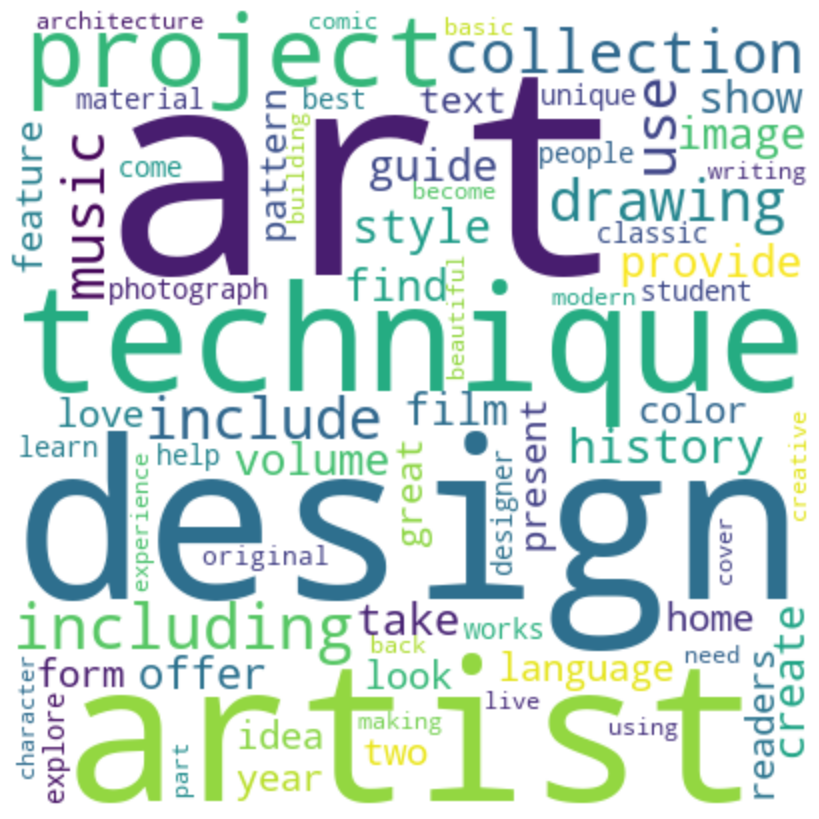

Word Cloud for business/finance


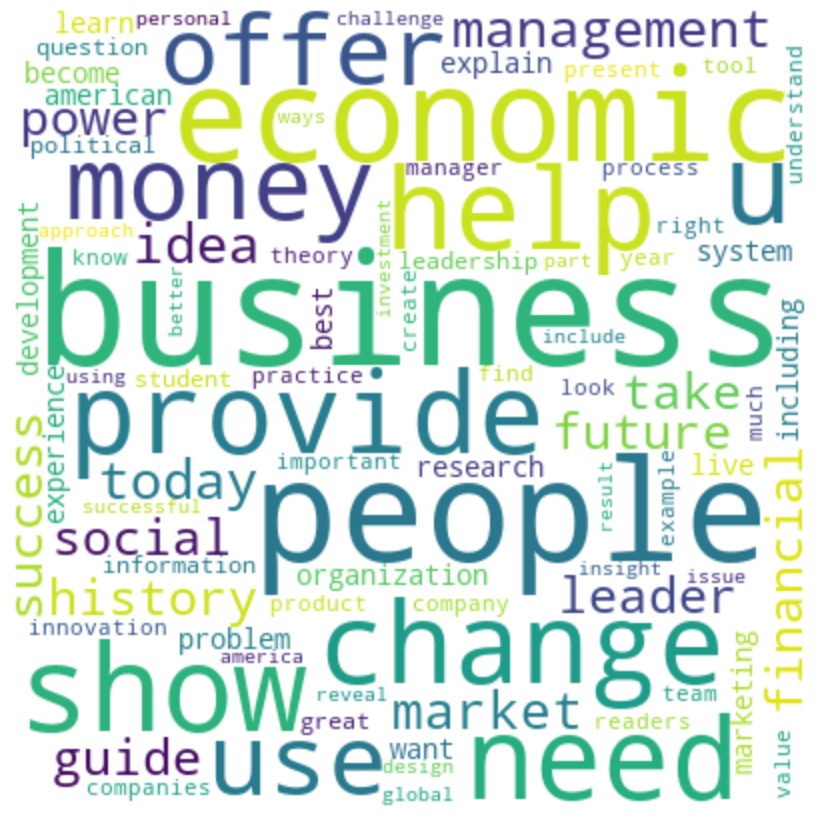

Word Cloud for fantasy/horror


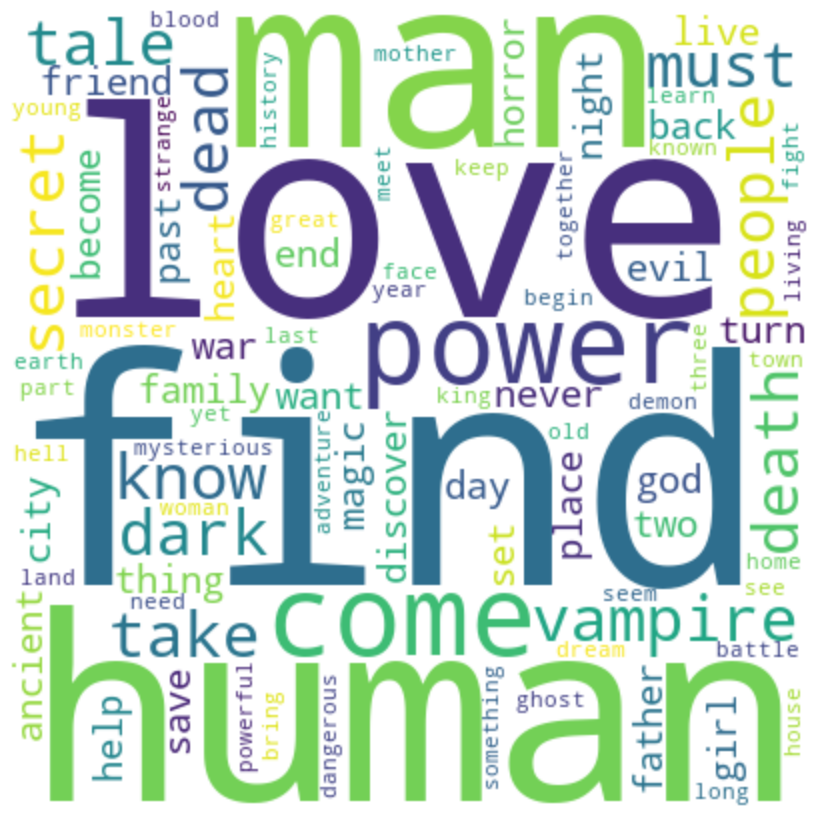

Word Cloud for food


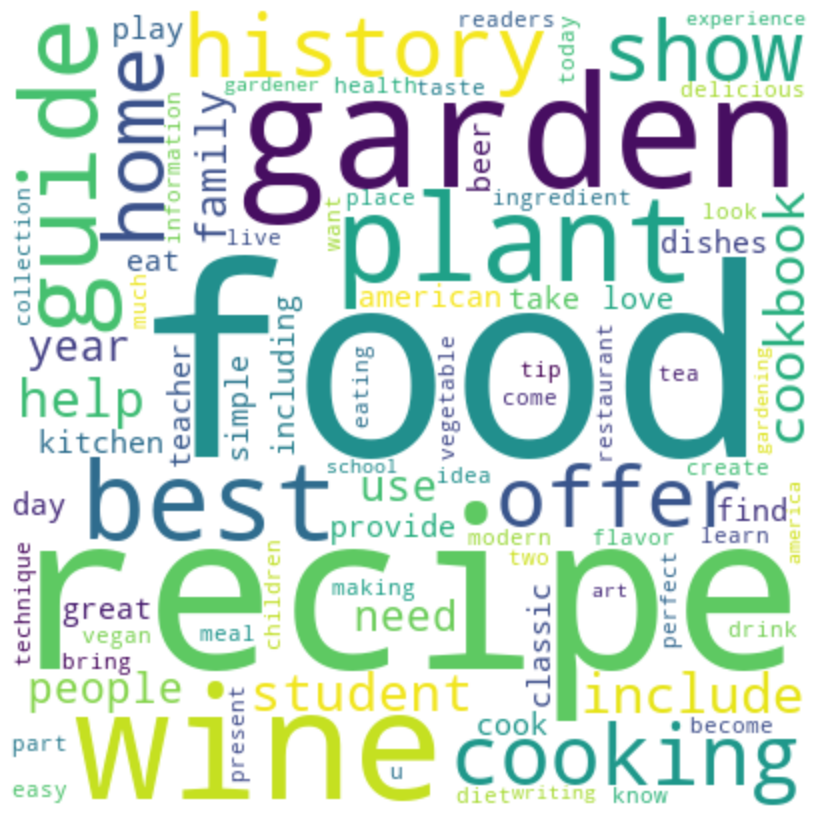

Word Cloud for history


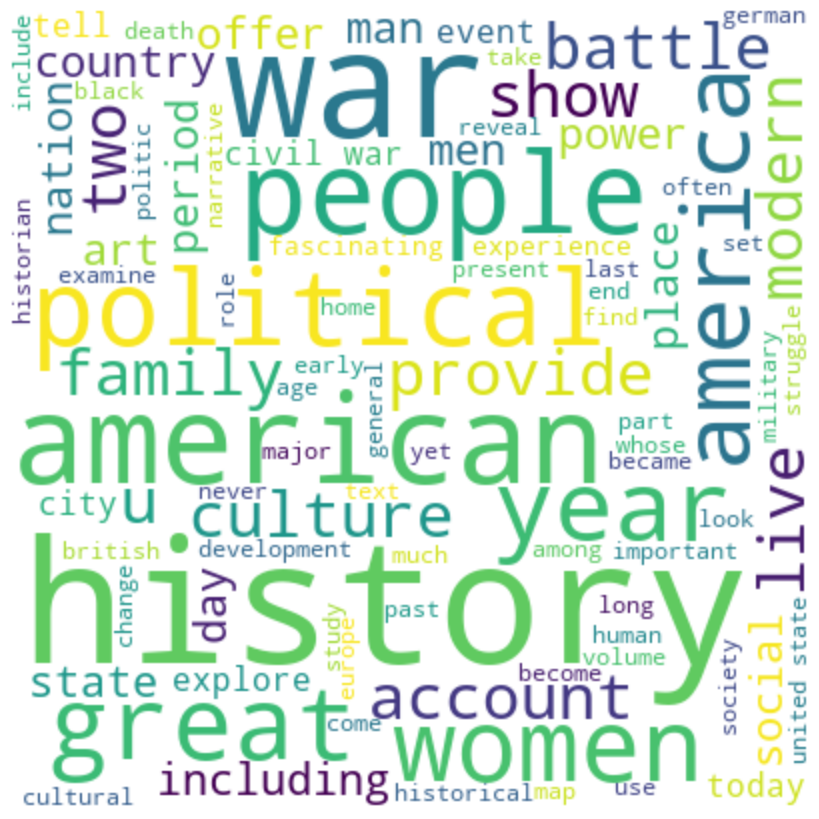

Word Cloud for religion/spirituality


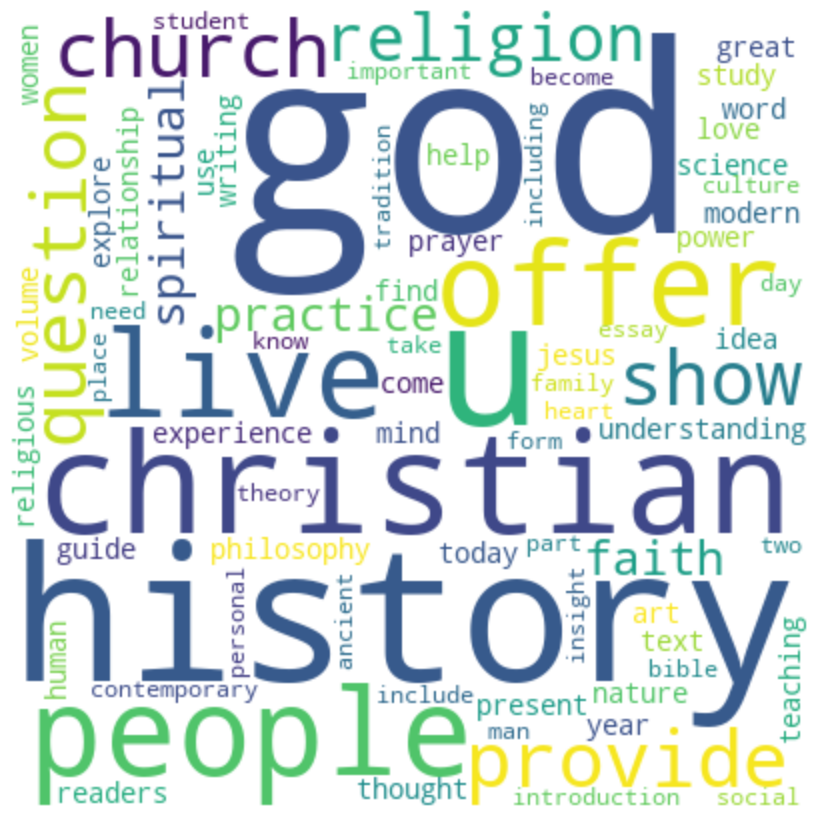

Word Cloud for romance


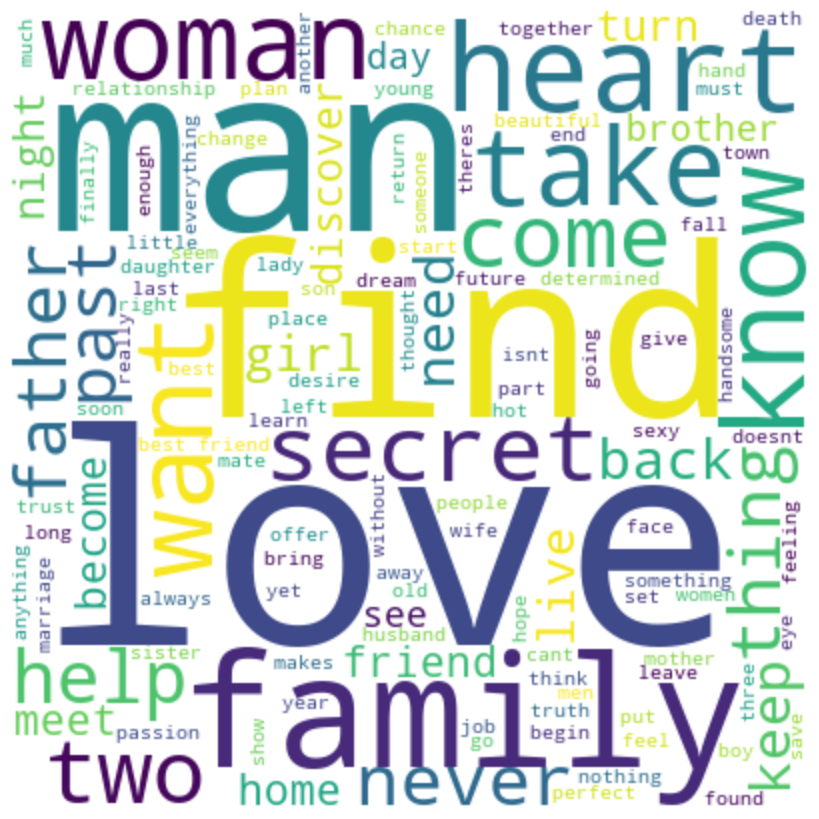

Word Cloud for science


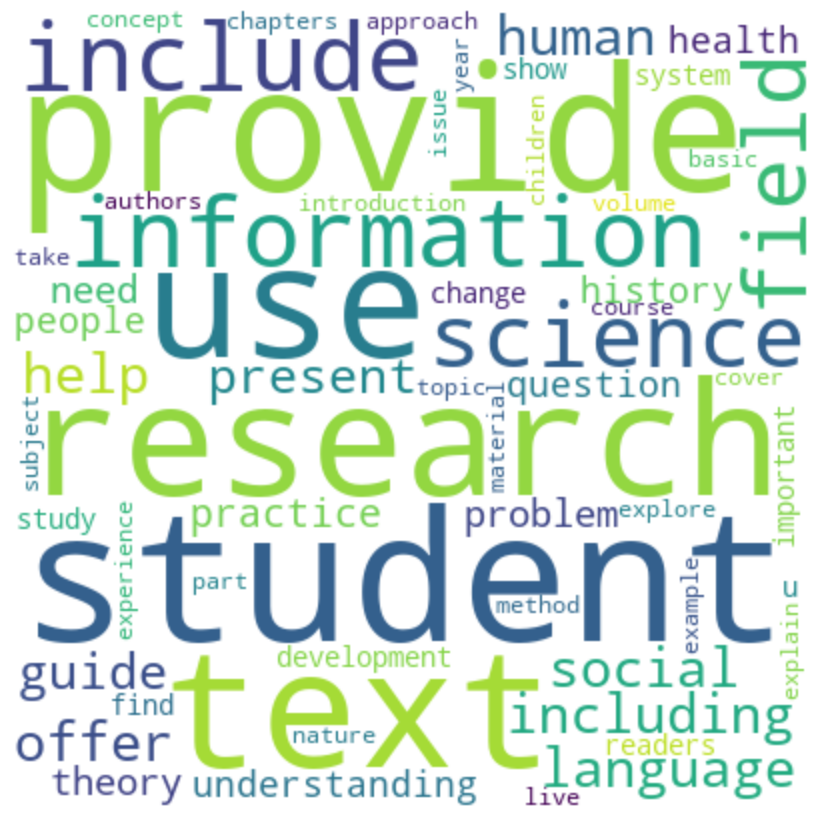

Word Cloud for science fiction


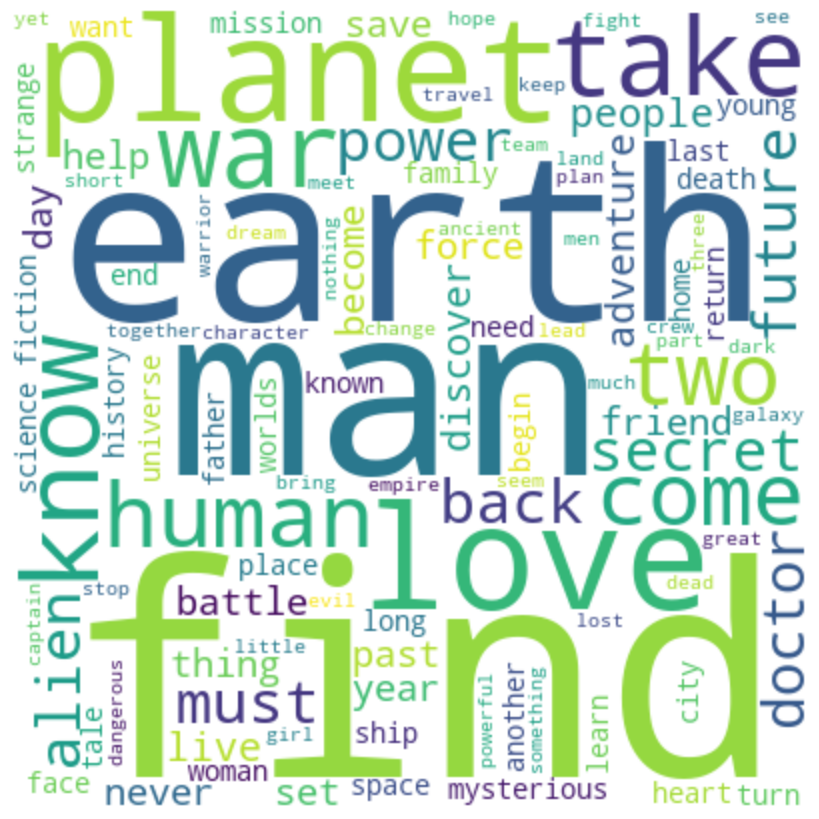

Word Cloud for thriller


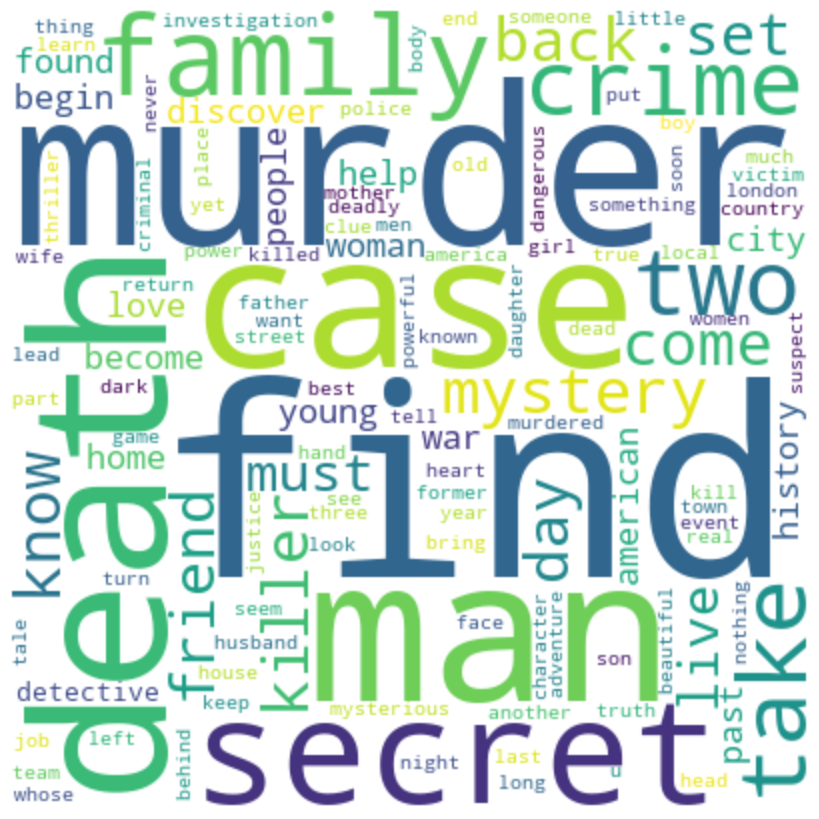

In [14]:
# Word Cloud

import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

# Custom word stops that are common between categories to remove meaningless words
custom_words = {
    'book', 'books', 'story', 'stories', 'novel', 'author', 'writes', 'written',
    'one', 'also', 'many', 'would', 'could', 'may', 'might', 'like', 'well',
    'plot', 'said', 'told', 'made', 'make', 'every', 'around', 'across', 'within',
    'even', 'though', 'however', 'still', 'good', 'new', 'time', 'life', 'way',
    'chapter', 'read', 'reading', 'reader', 'series', 'pages', 'page', 'one', 'hes',
    'shes', 'she', 'he', 'will', 'work', 'now', 'will', 'first', 'world'
}

# Define stopwords
stopwords = set(STOPWORDS)
stopwords.update(custom_words)

# Function to generate a word cloud for a given category
def print_wordCloud(category, text):
    if not text.strip():
        print(f"No data for category: {category}")
        return
    print(f"Word Cloud for {category}")
    wordcloud = WordCloud(
        width=400,
        height=400,
        background_color='white',
        stopwords=stopwords,
        colormap='viridis',
        min_font_size=10
    ).generate(text)
    
    plt.figure(figsize=(8, 8), facecolor='white')
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.show()

# Function to combine all descriptions for a specific category
def make_string(category_name, data):
    text = ""
    for _, row in data.iterrows():
        if row['category'] == category_name:
            text += str(row['description']) + ' '
    return text

# Example usage
for category in le.classes_:
    combined_text = make_string(category, df_balanced)
    print_wordCloud(category, combined_text)


Word Cloud for art


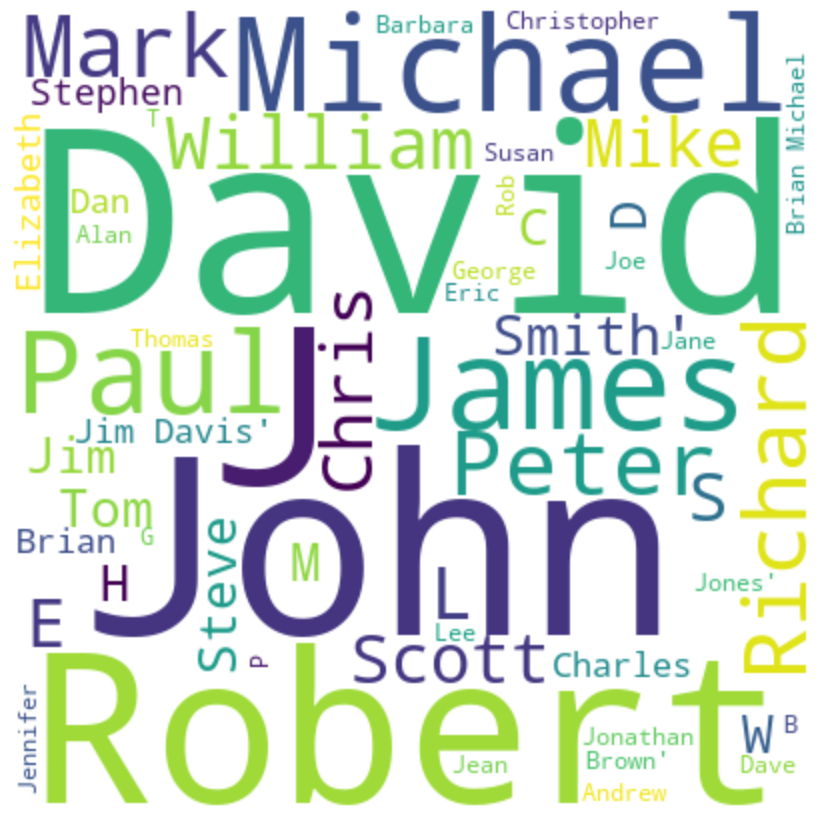

Word Cloud for business/finance


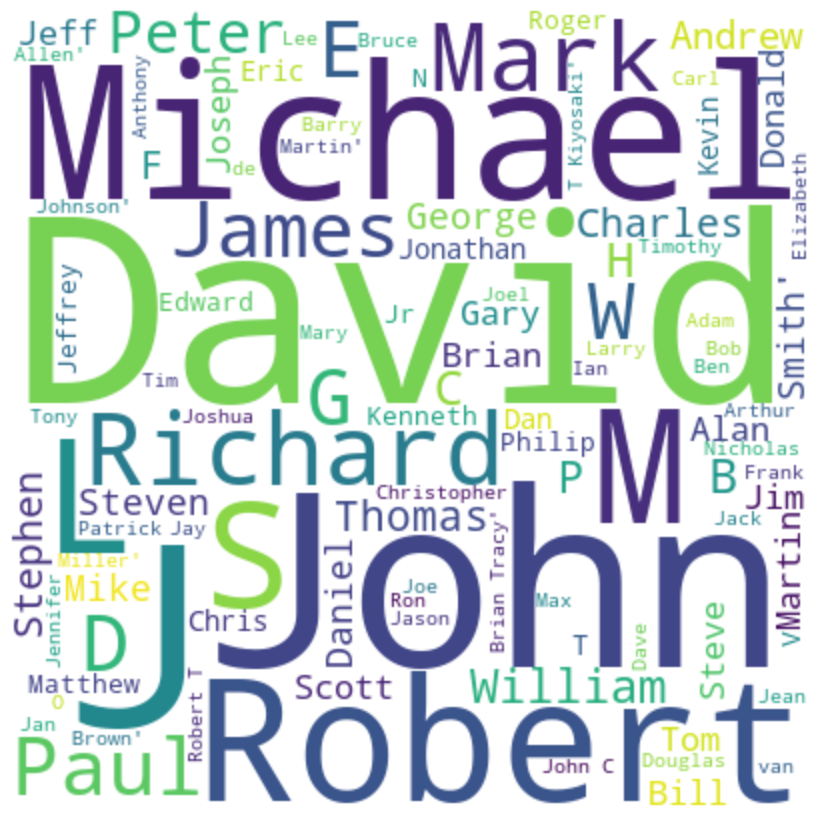

Word Cloud for fantasy/horror


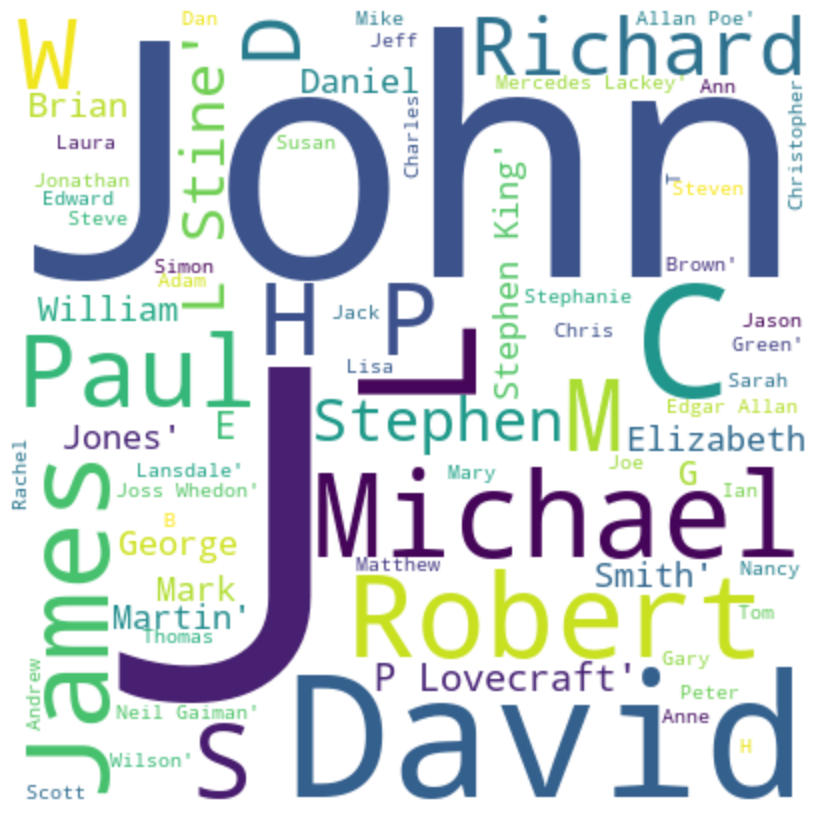

Word Cloud for food


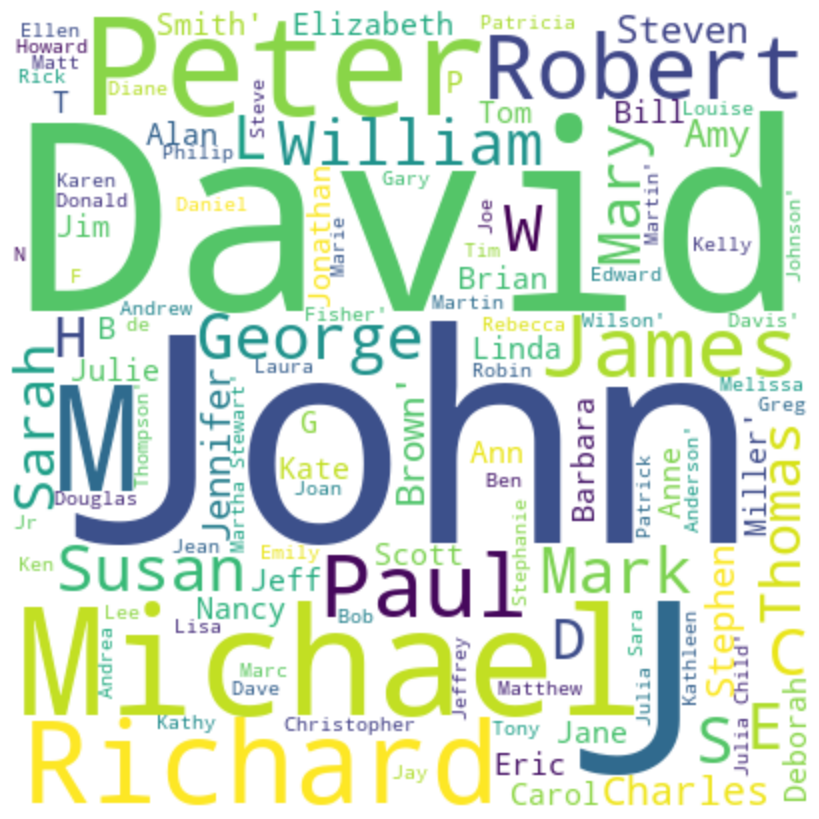

Word Cloud for history


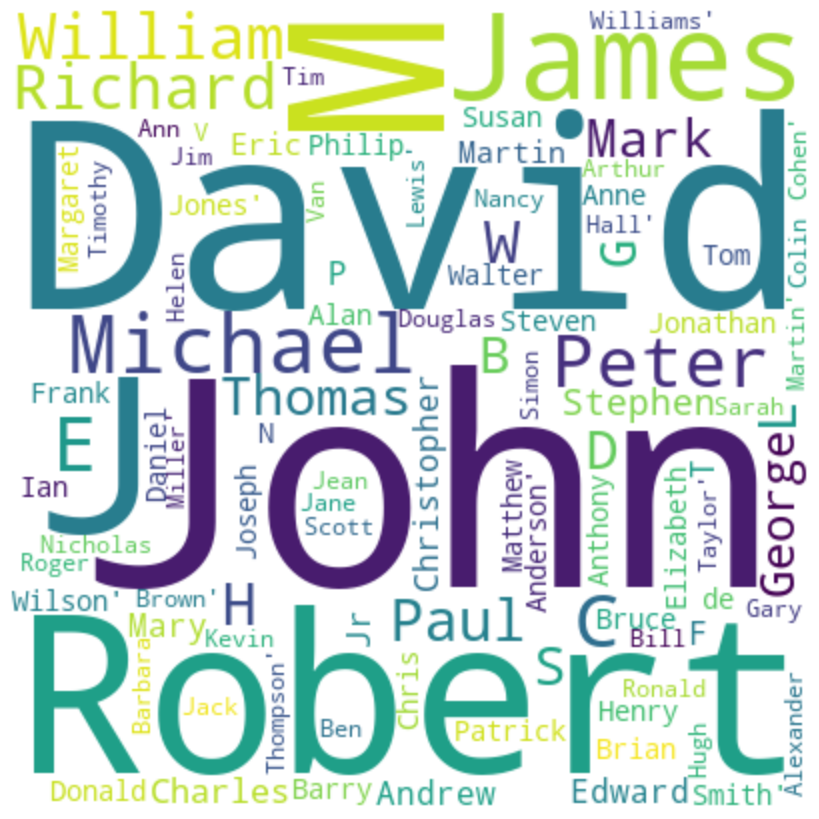

Word Cloud for religion/spirituality


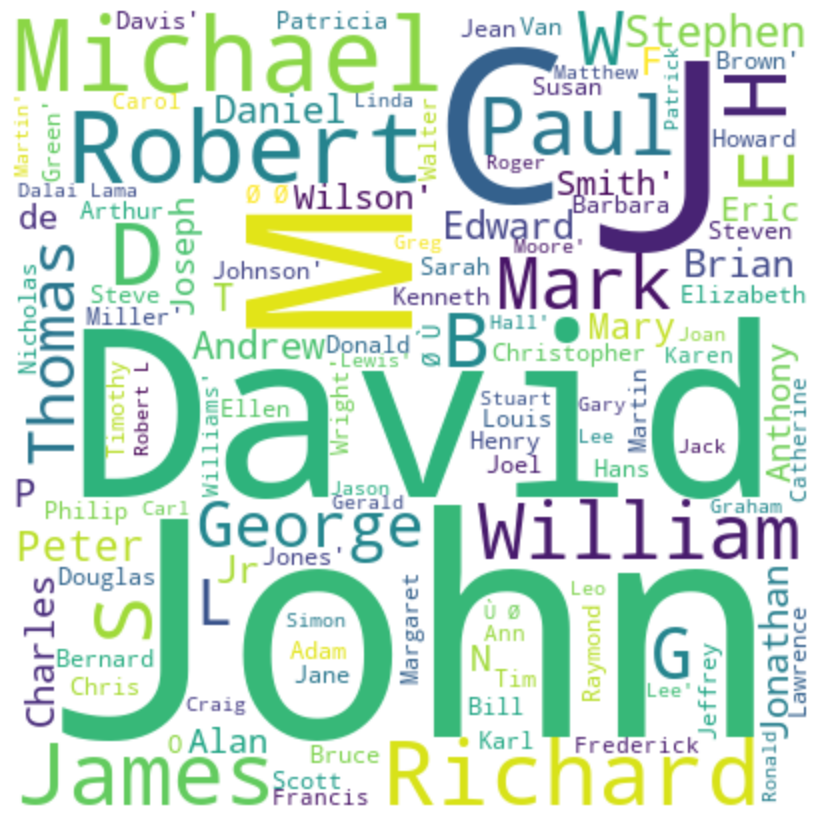

Word Cloud for romance


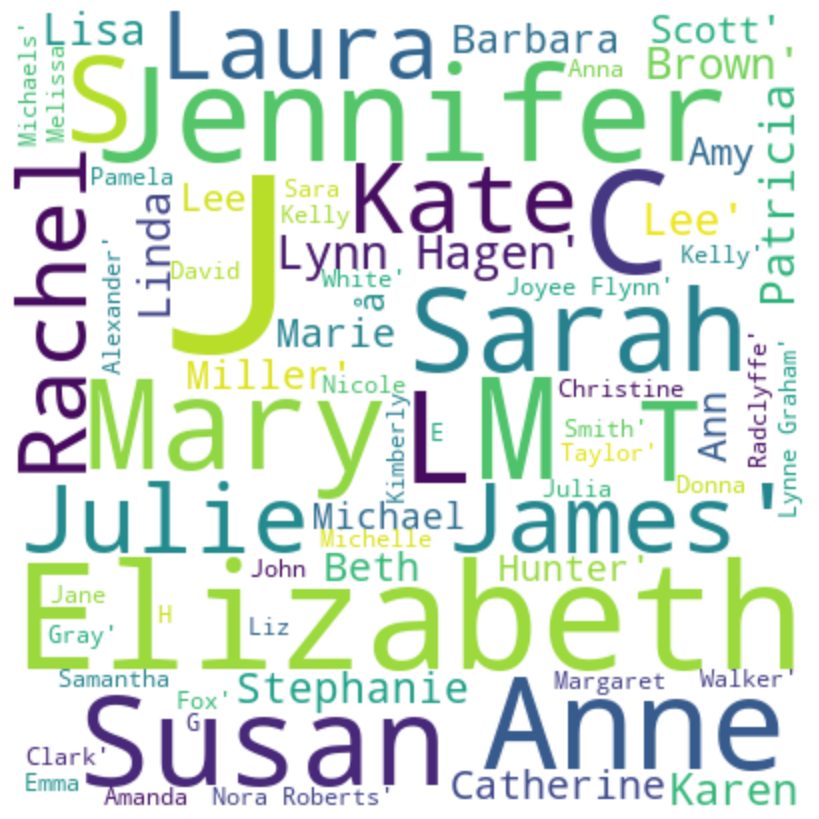

Word Cloud for science


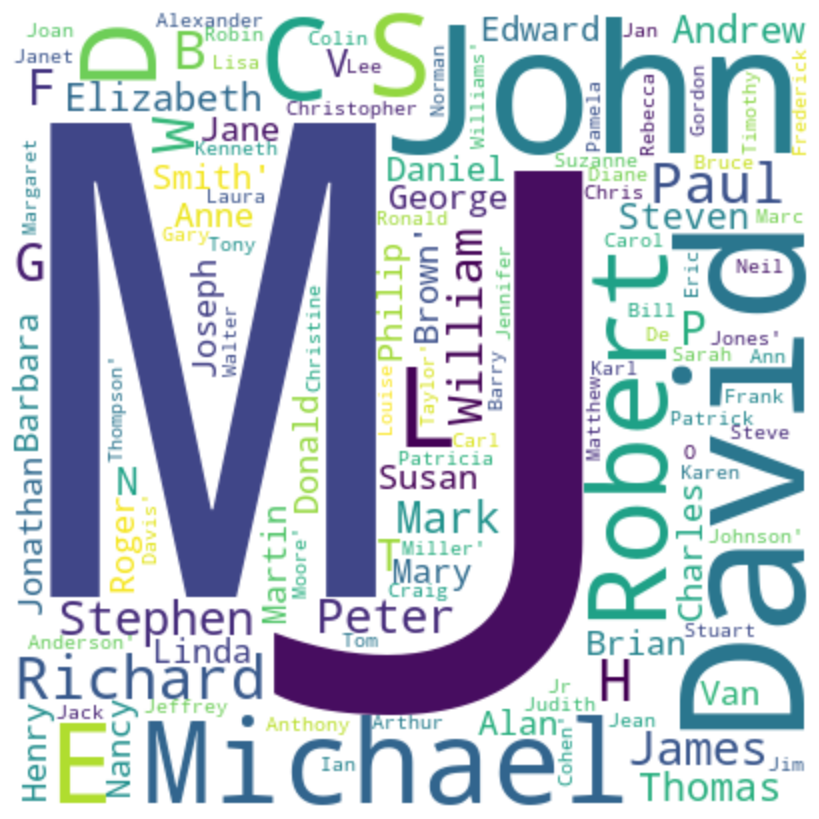

Word Cloud for science fiction


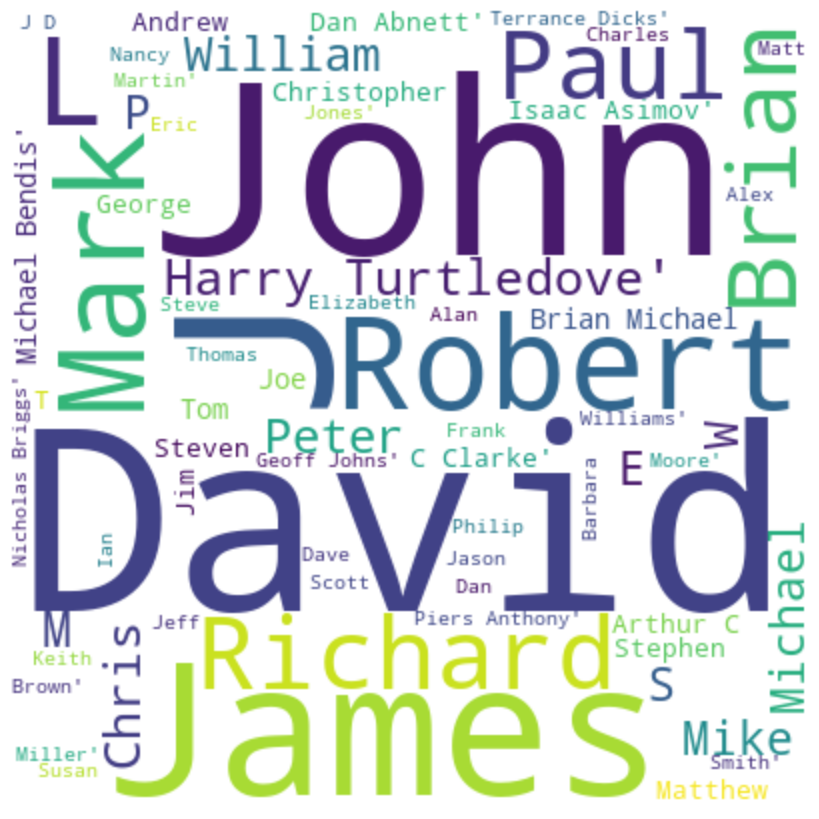

Word Cloud for thriller


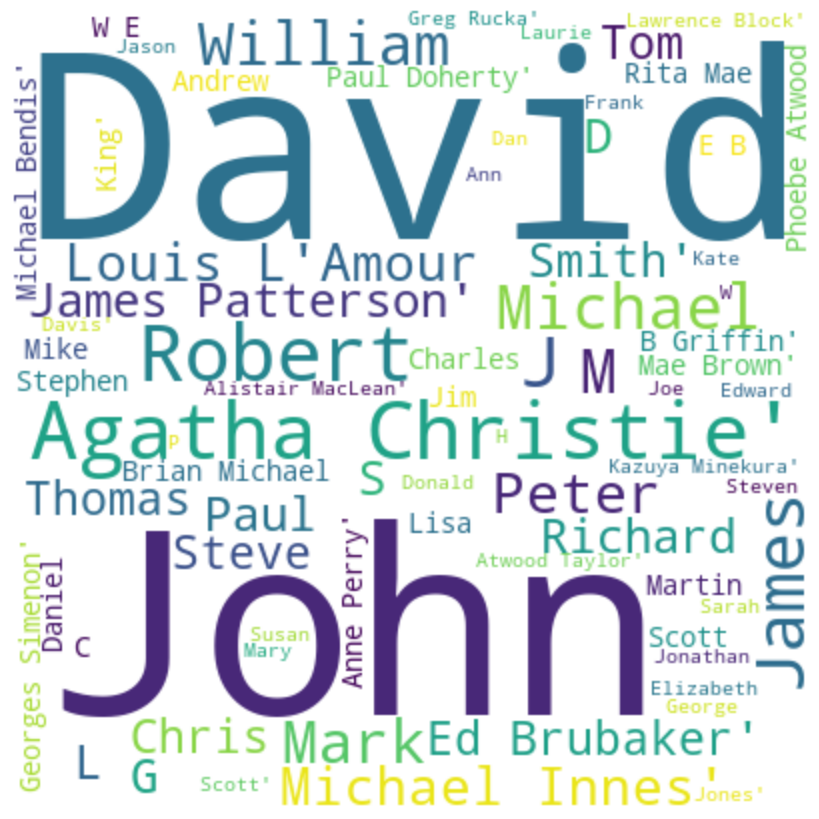

In [30]:
# Function to generate a word cloud for a given author
def print_wordCloud(category, author):
    if not author.strip():
        print(f"No data for category: {category}")
        return
    print(f"Word Cloud for {category}")
    wordcloud = WordCloud(
        width=400,
        height=400,
        background_color='white',
        stopwords=stopwords,
        colormap='viridis',
        min_font_size=10
    ).generate(author)
    
    plt.figure(figsize=(8, 8), facecolor='white')
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.show()

# Function to combine all descriptions for a specific category
def make_string(category_name, data):
    author = ""
    for _, row in data.iterrows():
        if row['category'] == category_name:
            author += str(row['authors']) + ' '
    return author

# Example usage
for category in le.classes_:
    combined_text = make_string(category, df_balanced)
    print_wordCloud(category, combined_text)


Word Cloud for art


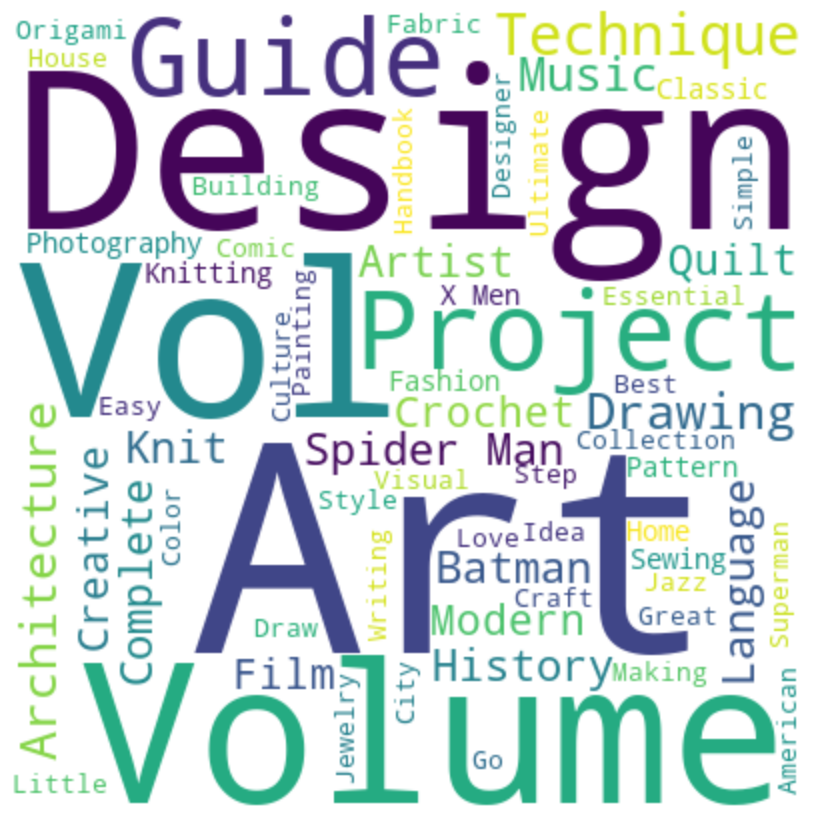

Word Cloud for business/finance


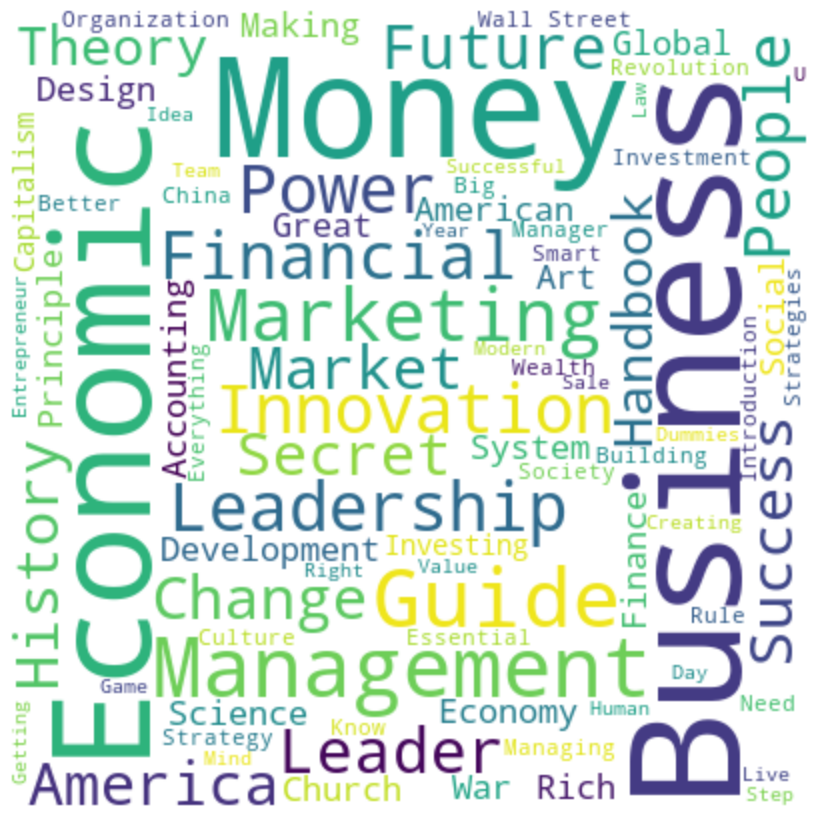

Word Cloud for fantasy/horror


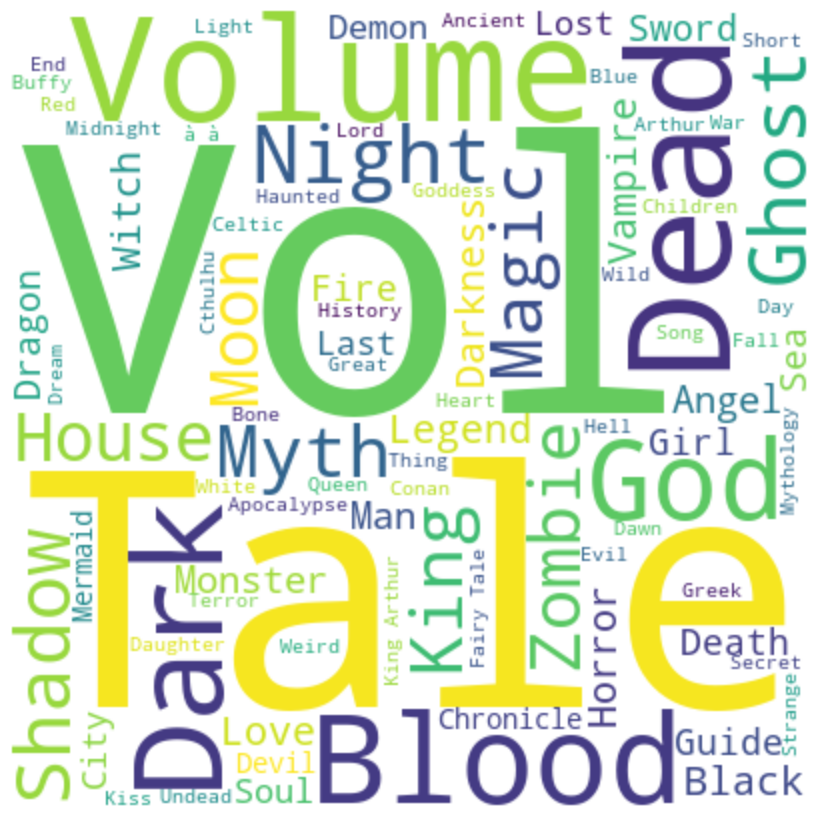

Word Cloud for food


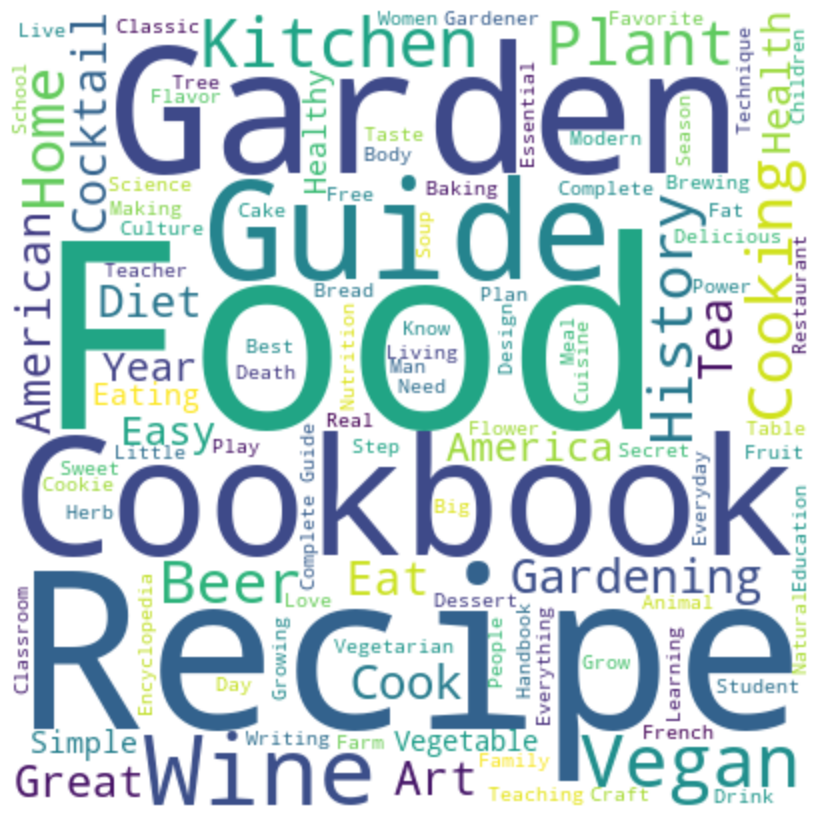

Word Cloud for history


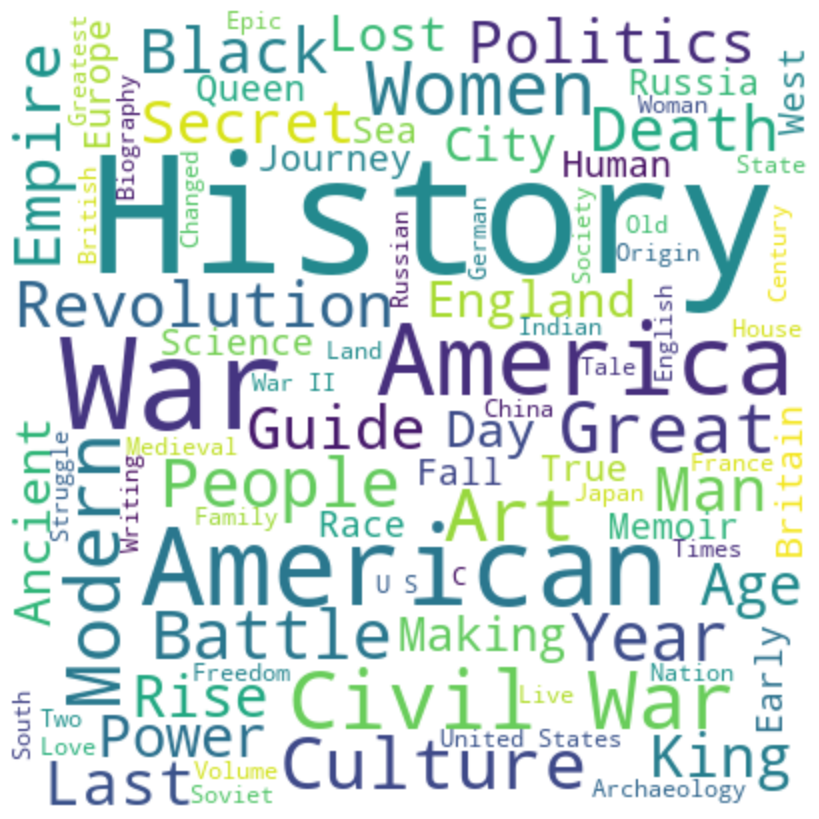

Word Cloud for religion/spirituality


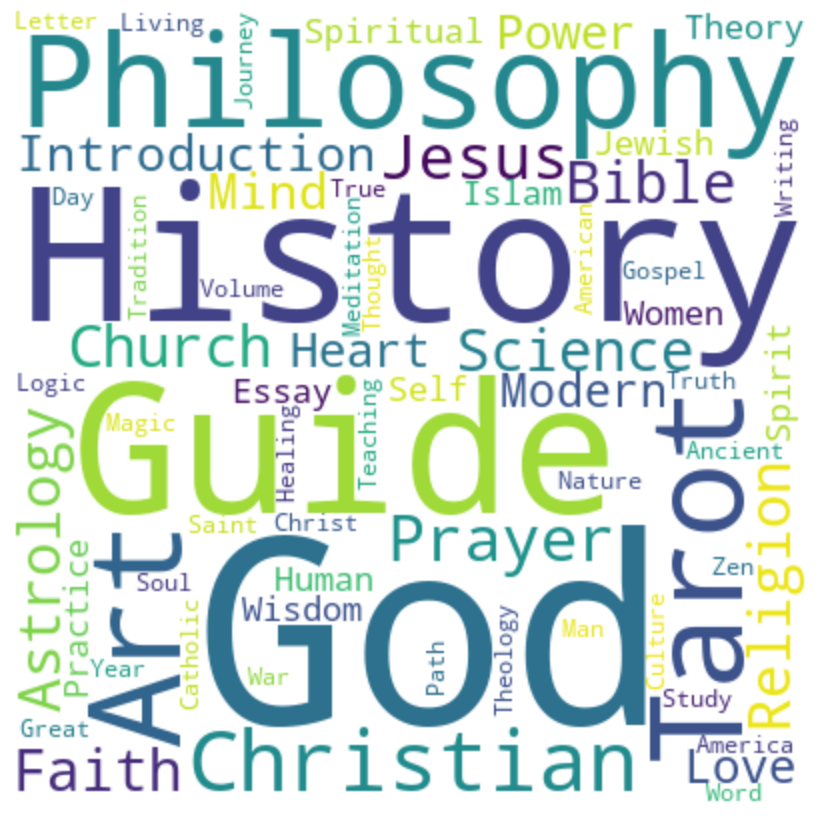

Word Cloud for romance


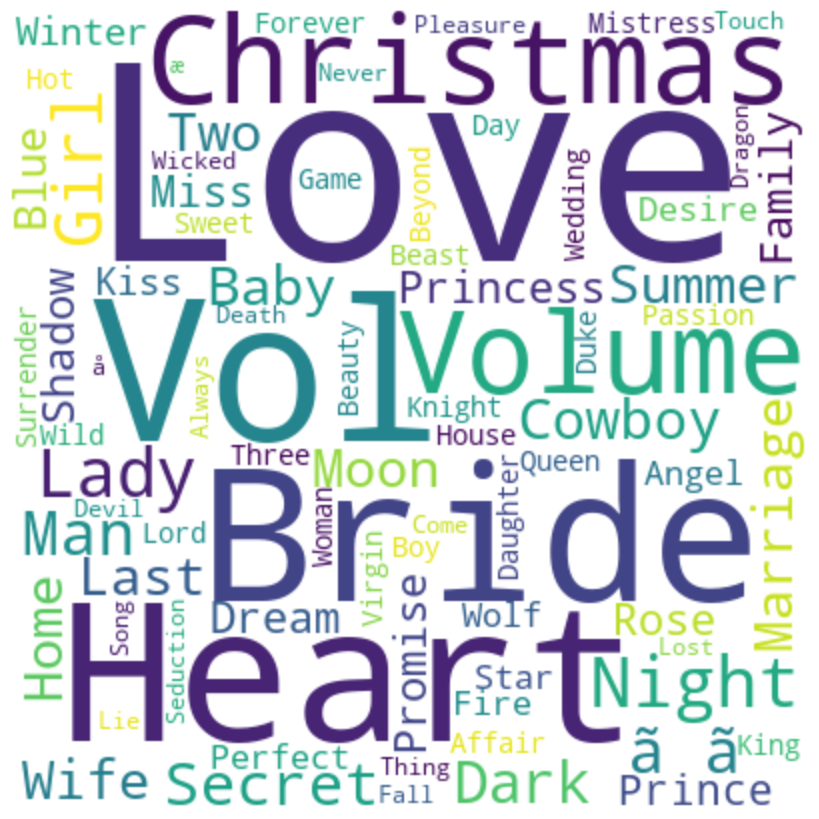

Word Cloud for science


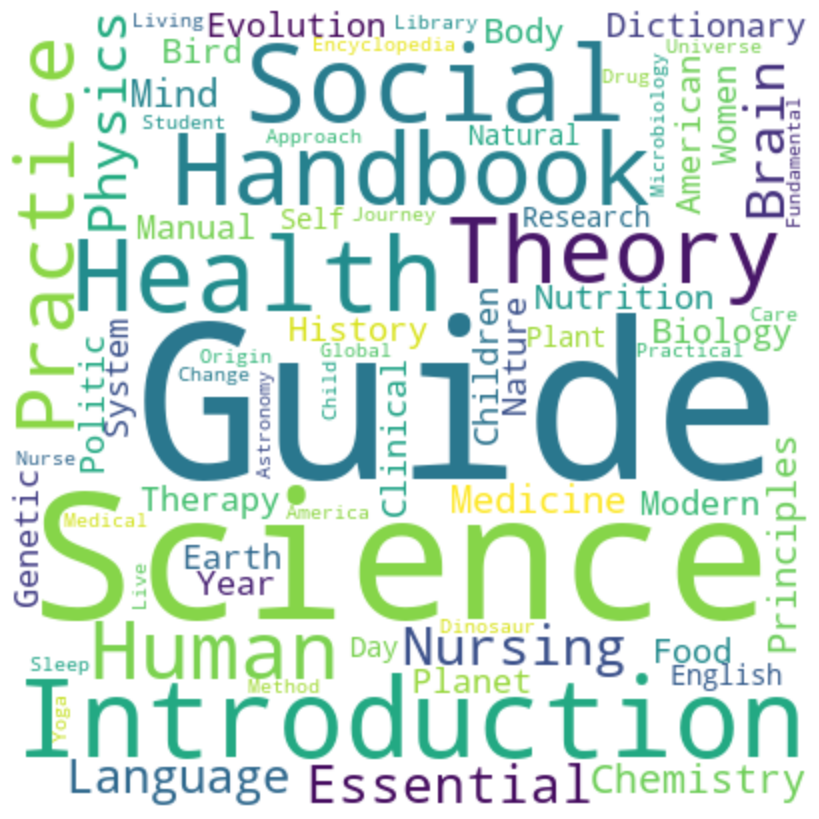

Word Cloud for science fiction


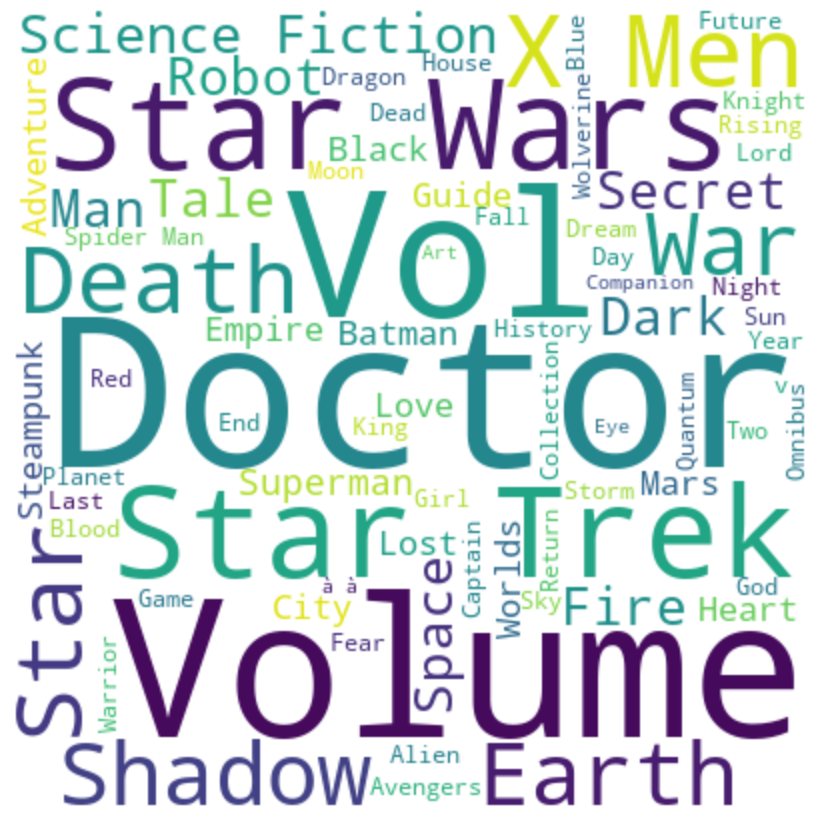

Word Cloud for thriller


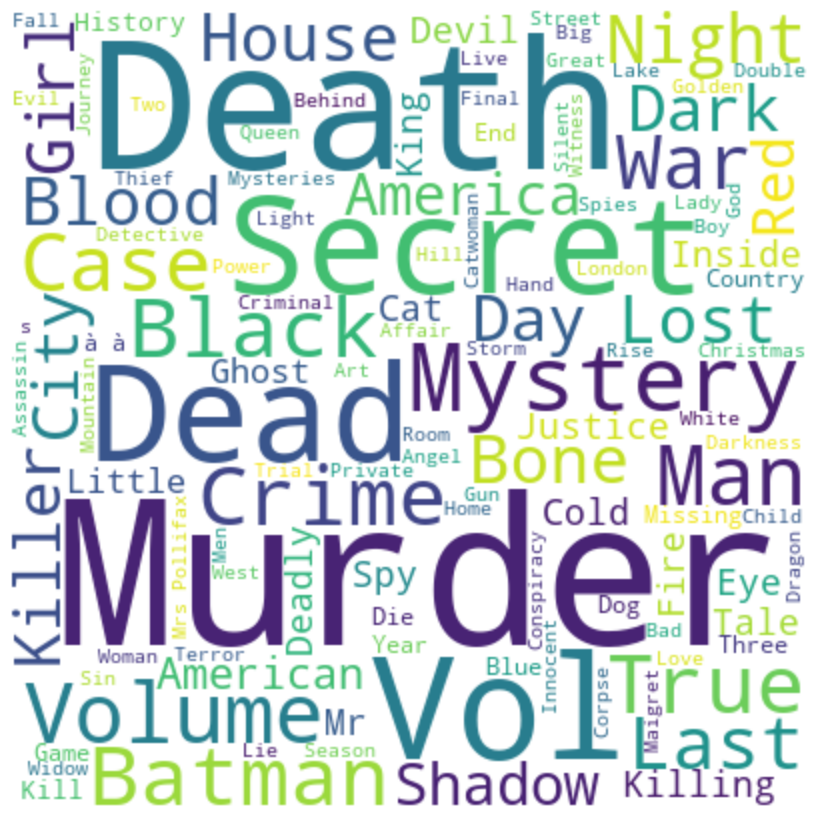

In [31]:
# Function to generate a word cloud for a given title
def print_wordCloud(category, title):
    if not title.strip():
        print(f"No data for category: {category}")
        return
    print(f"Word Cloud for {category}")
    wordcloud = WordCloud(
        width=400,
        height=400,
        background_color='white',
        stopwords=stopwords,
        colormap='viridis',
        min_font_size=10
    ).generate(title)
    
    plt.figure(figsize=(8, 8), facecolor='white')
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.show()

# Function to combine all descriptions for a specific category
def make_string(category_name, data):
    title = ""
    for _, row in data.iterrows():
        if row['category'] == category_name:
            title += str(row['title']) + ' '
    return title

# Example usage
for category in le.classes_:
    combined_text = make_string(category, df_balanced)
    print_wordCloud(category, combined_text)
